In [1]:
import logging
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pyobsbox import Checker

In [3]:
logging.getLogger("pyobsbox").setLevel(logging.WARNING)
logging.getLogger("pyobsbox.plotter").setLevel(logging.DEBUG)

# List models

In [4]:
models_folder = Path("../../models")

In [5]:
[model.name for model in list(models_folder.glob('model_*'))]

['model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42',
 'model_dense_512_128_32_8_B1H_Inst_center_scale_100_seed_42',
 'model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_seed_42',
 'model_time_dist_32_16_B1H_Inst_500',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_stride_4_B1H_Inst',
 'model_conv_32_16_stride_4_B1H_Inst_jorg',
 'model_conv_max_pool_64_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_1000_seed_42',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_2049_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_10000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_1000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_znorm_seed_42',
 'model_conv_32

In [6]:
model_path = models_folder / "model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_129_seed_42"

In [7]:
checker = Checker(model_path)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 512, 64)           960       
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 128, 32)           14368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 16)            3600      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 8)              9

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

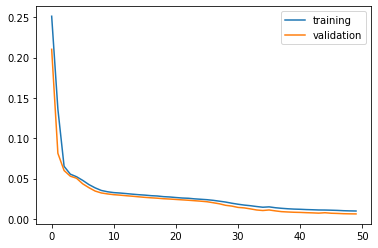

In [8]:
checker.plot_loss()

In [9]:
train_data, train_meta = checker.load_train_dataset()
train_prediction = checker.predict(train_data)

bunch_sorted_index: [2 0 1]
group_bunches: [418. 966. 194.]
group_bunches sorted: [194. 418. 966.]
restore_index: [1 2 0]
group_bunches restored: [418. 966. 194.]
bunch_sorted_index: [0 1 2]
group_bunches: [ 427.  925. 2319.]
group_bunches sorted: [ 427.  925. 2319.]
restore_index: [0 1 2]
group_bunches restored: [ 427.  925. 2319.]
bunch_sorted_index: [2 1 0]
group_bunches: [467. 364.  87.]
group_bunches sorted: [ 87. 364. 467.]
restore_index: [2 1 0]
group_bunches restored: [467. 364.  87.]
bunch_sorted_index: [1 0 2]
group_bunches: [2344. 1398. 2605.]
group_bunches sorted: [1398. 2344. 2605.]
restore_index: [1 0 2]
group_bunches restored: [2344. 1398. 2605.]
bunch_sorted_index: [0 1 2]
group_bunches: [  76. 1788. 2450.]
group_bunches sorted: [  76. 1788. 2450.]
restore_index: [0 1 2]
group_bunches restored: [  76. 1788. 2450.]

50/50 [==============================] - 60s 1s/step


In [10]:
train_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
582,Inst,7319,1,h,7,2018-10-19 13:54:37,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7319/...,924,709.0,518.0,65536,2
4568,Inst,6629,1,h,7,2018-05-01 14:14:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6629/...,1887,1469.0,904.0,65536,17
5936,Inst,6961,1,h,7,2018-07-22 22:24:16,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6961/...,2556,2888.0,2135.0,65536,23
6461,Inst,6279,1,h,7,2017-10-07 11:43:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6279/...,1868,2242.0,1208.0,65536,25
5157,Inst,6272,1,h,7,2017-10-05 11:07:13,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/...,1836,2751.0,1459.0,65536,20


In [11]:
train_meta.shape

(396800, 12)

In [12]:
train_data.shape

(396800, 2048, 2)

In [13]:
train_prediction.shape

(396800, 2048, 2)

In [14]:
validation_data, validation_meta = checker.load_validation_dataset()
validation_prediction = checker.predict(validation_data)


5/5 [==============================] - 5s 994ms/step


In [15]:
validation_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
4808,Inst,6654,1,h,7,2018-05-07 22:15:06,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6654/...,924,1032.0,735.0,65536,18
1244,Inst,6436,1,h,7,2017-11-30 01:50:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6436/...,408,2214.0,352.0,65536,4
5767,Inst,7354,1,h,7,2018-10-25 20:13:17,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7354/...,348,683.0,308.0,65536,22
7206,Inst,7483,1,h,7,2018-11-29 02:11:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7483/...,648,1364.0,252.0,65536,28
7624,Inst,6654,1,h,7,2018-05-07 22:15:06,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6654/...,924,1032.0,735.0,65536,29


In [16]:
validation_meta.shape

(39680, 12)

In [17]:
validation_data.shape

(39680, 2048, 2)

In [18]:
validation_prediction.shape

(39680, 2048, 2)

In [19]:
def plot_train_index(index: int):
    """Helper function to plot a sample from the train dataset.
    """
    true_signal = train_data[index]
    predicted_signal = train_prediction[index]
    metadata_row = train_meta.iloc[index]
    print(f"index: {index}")
    print(f"Error: {train_error[index]}")
    print(metadata_row)
    checker.plot_sample(metadata_row, true_signal, predicted_signal)
    plt.show()
    encoded = checker.encode(true_signal)
    plt.imshow(encoded)
    plt.show()

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

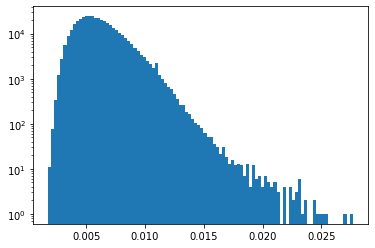

In [20]:
train_error = checker.MSE(train_data, train_prediction)
checker.plot_error(train_error, bins=100)

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

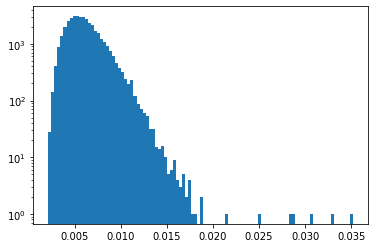

In [21]:
validation_error = checker.MSE(validation_data, validation_prediction)
checker.plot_error(validation_error, bins=100)

In [22]:
# Histogram peak
hist, bins = np.histogram(train_error, bins=100)
hist_peak = bins[np.argmax(hist)]

index: 0
Error: 0.009559388313278835
type                                                         Inst
fill                                                         7319
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-19 13:54:37
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7319/...
n_bunches                                                     924
bunch_index                                                   709
bunch_number                                                  518
ts_length                                                   65536
chunk                                                           2
Name: 582, dtype: object


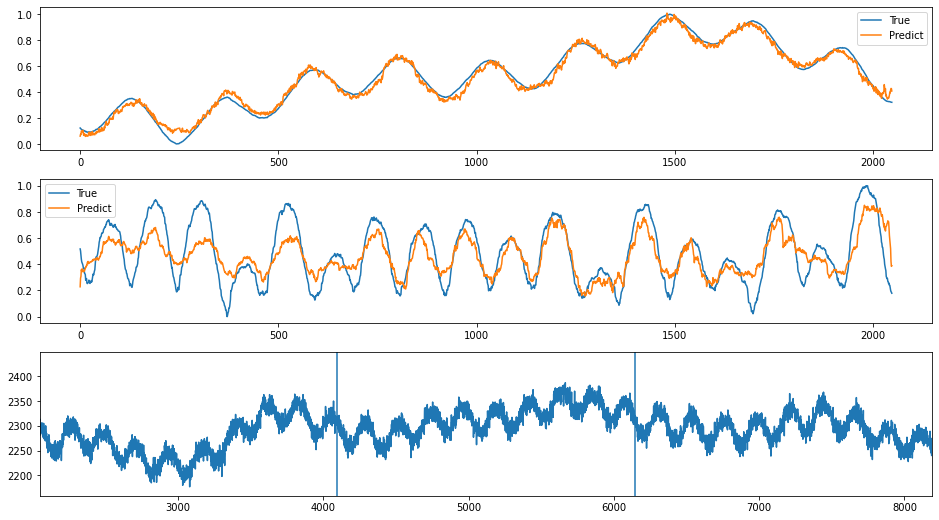

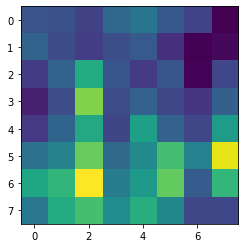

In [23]:
# plotting a random sample
plot_train_index(0)

In [24]:
sorted_error_indices = np.argsort(train_error)

# From left to right

index: 379885
Error: 0.0017820134500830915
type                                                         Inst
fill                                                         6370
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-09 02:32:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6370/...
n_bunches                                                    1868
bunch_index                                                   855
bunch_number                                                  450
ts_length                                                   65536
chunk                                                          17
Name: 4415, dtype: object


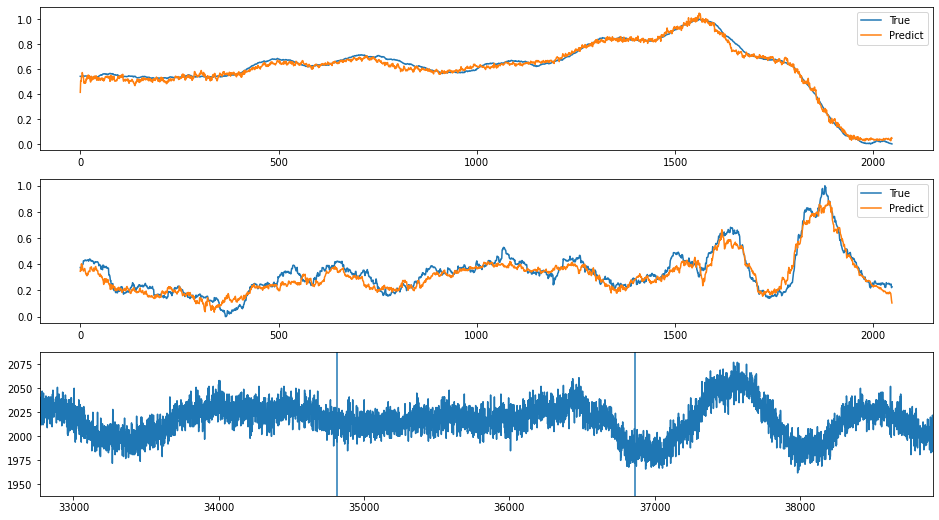

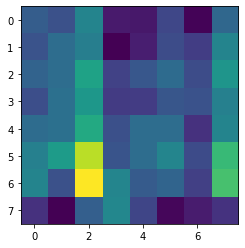

index: 155845
Error: 0.0019477820113994772
type                                                         Inst
fill                                                         6243
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-26 08:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6243/...
n_bunches                                                    1916
bunch_index                                                    64
bunch_number                                                   22
ts_length                                                   65536
chunk                                                          28
Name: 7385, dtype: object


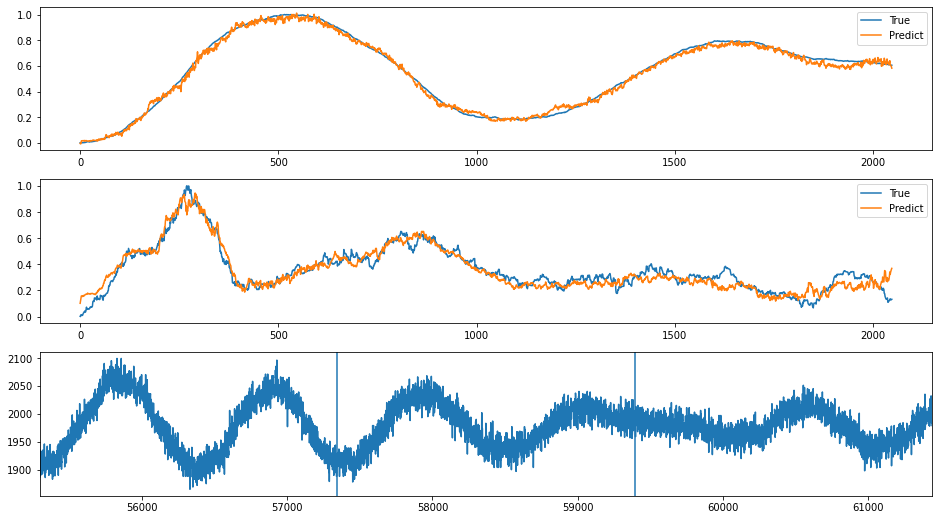

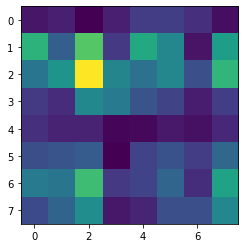

index: 51085
Error: 0.0019530866174598729
type                                                         Inst
fill                                                         7464
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-22 04:54:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7464/...
n_bunches                                                     460
bunch_index                                                  1576
bunch_number                                                  210
ts_length                                                   65536
chunk                                                          21
Name: 5537, dtype: object


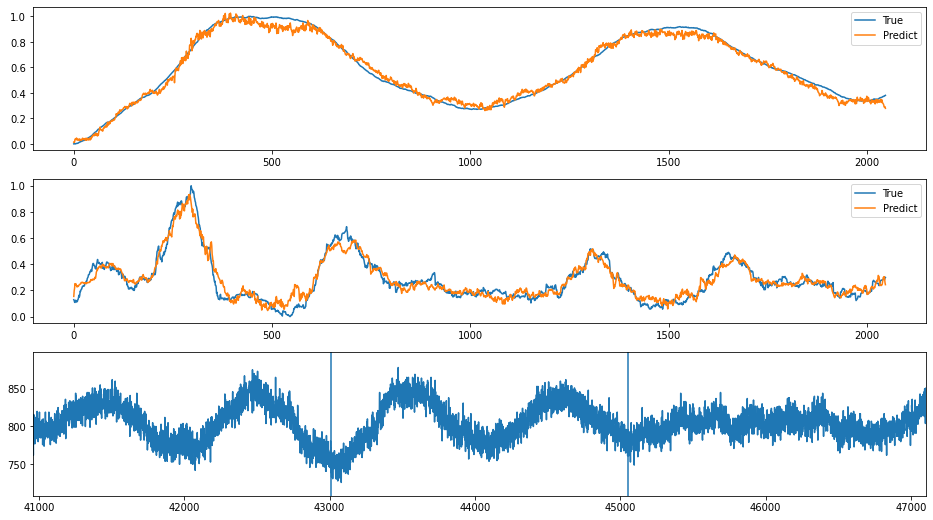

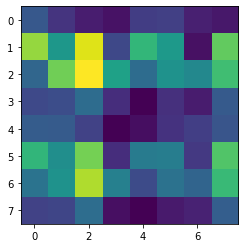

index: 209803
Error: 0.0019678057858692048
type                                                         Inst
fill                                                         7133
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-07 15:50:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7133/...
n_bunches                                                    2556
bunch_index                                                  2370
bunch_number                                                 1749
ts_length                                                   65536
chunk                                                          19
Name: 4977, dtype: object


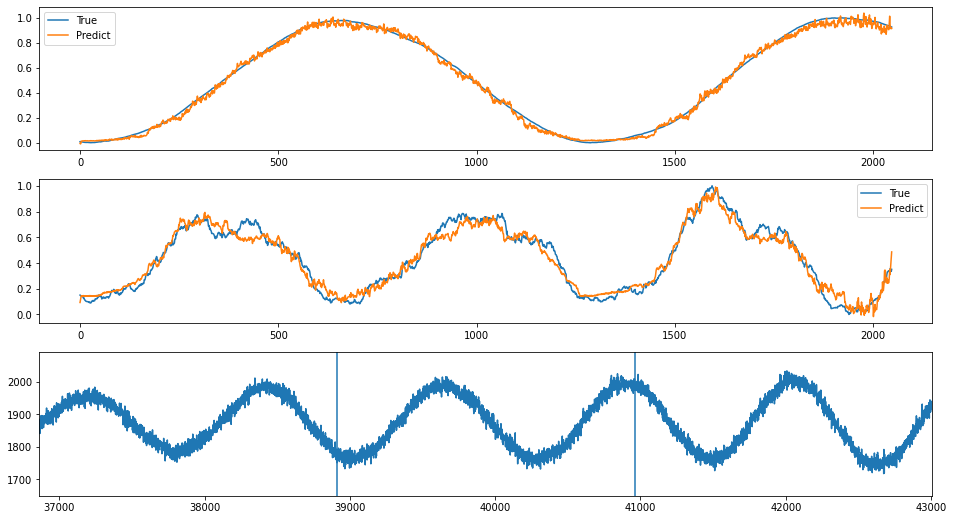

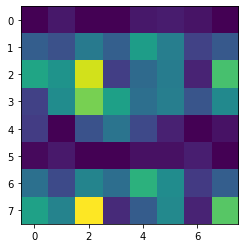

index: 168458
Error: 0.0019937958320559585
type                                                         Inst
fill                                                         6616
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-27 08:35:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6616/...
n_bunches                                                     987
bunch_index                                                  3012
bunch_number                                                  859
ts_length                                                   65536
chunk                                                           9
Name: 2511, dtype: object


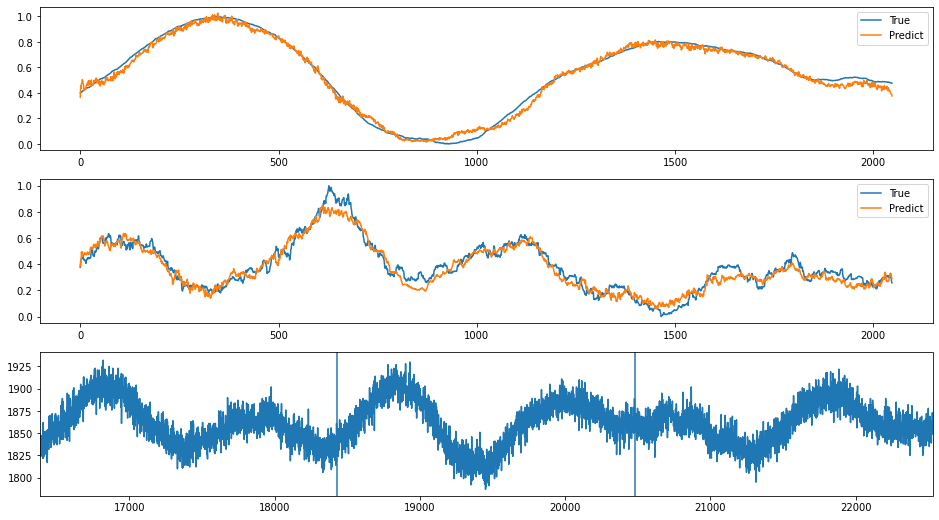

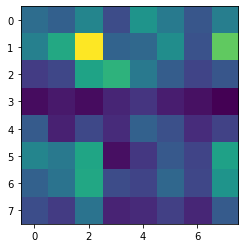

index: 221784
Error: 0.00200743240902718
type                                                         Inst
fill                                                         7468
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-23 20:55:20
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7468/...
n_bunches                                                     733
bunch_index                                                  2848
bunch_number                                                  603
ts_length                                                   65536
chunk                                                           1
Name: 350, dtype: object


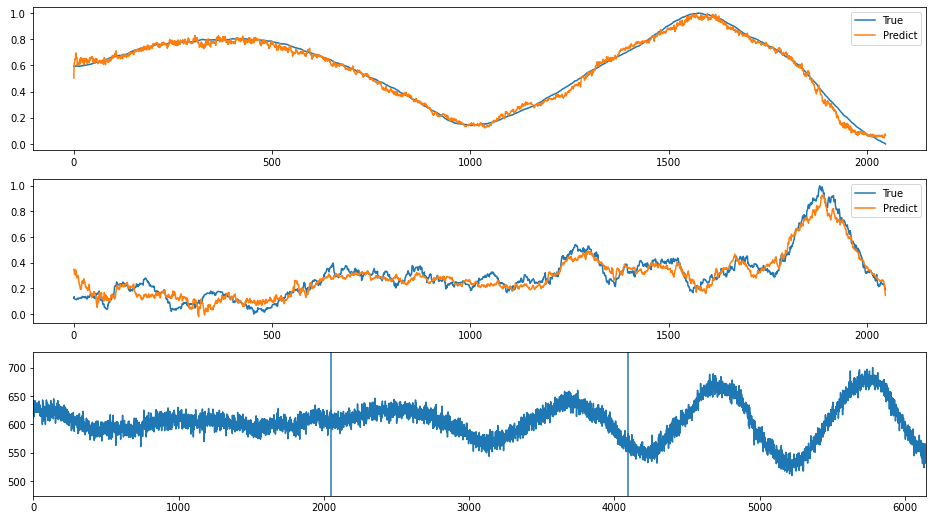

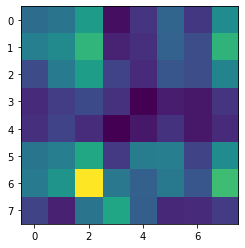

index: 174463
Error: 0.002009589403338711
type                                                         Inst
fill                                                         6617
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-27 18:28:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6617/...
n_bunches                                                     987
bunch_index                                                  2045
bunch_number                                                  580
ts_length                                                   65536
chunk                                                          14
Name: 3650, dtype: object


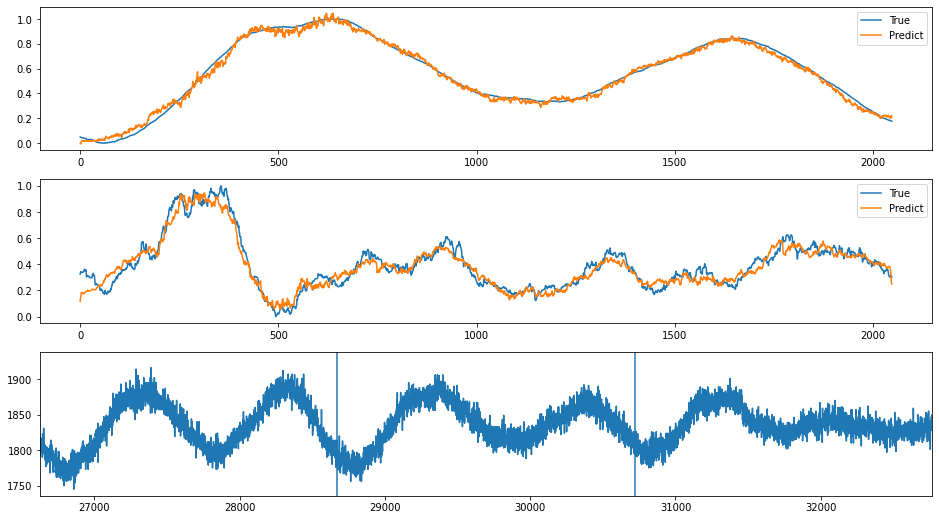

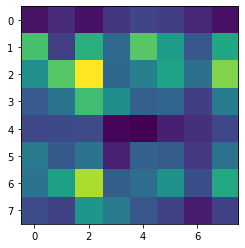

index: 254153
Error: 0.0020251914970236947
type                                                         Inst
fill                                                         6595
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-23 00:47:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6595/...
n_bunches                                                     339
bunch_index                                                  2696
bunch_number                                                  265
ts_length                                                   65536
chunk                                                          20
Name: 5255, dtype: object


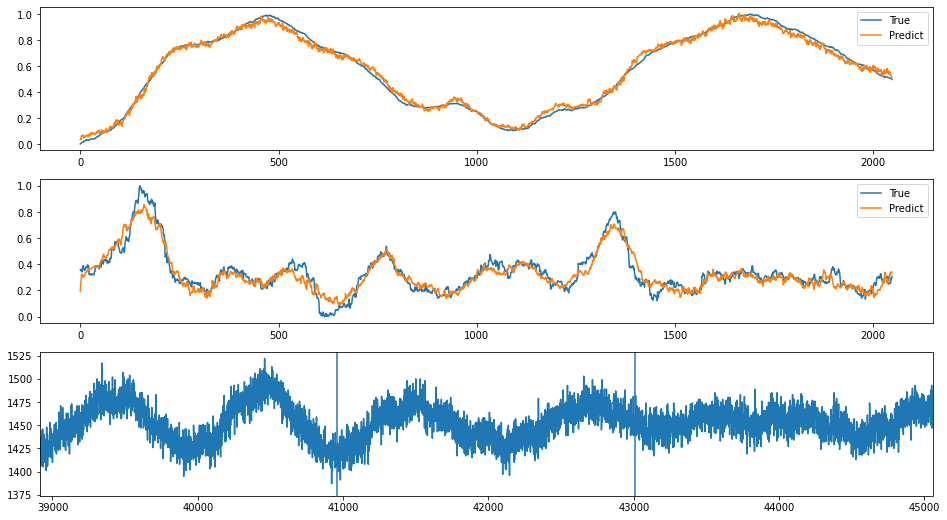

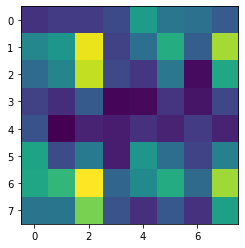

index: 233801
Error: 0.00202659251736495
type                                                         Inst
fill                                                         7101
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-30 01:57:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7101/...
n_bunches                                                    2556
bunch_index                                                  2783
bunch_number                                                 2068
ts_length                                                   65536
chunk                                                           8
Name: 2087, dtype: object


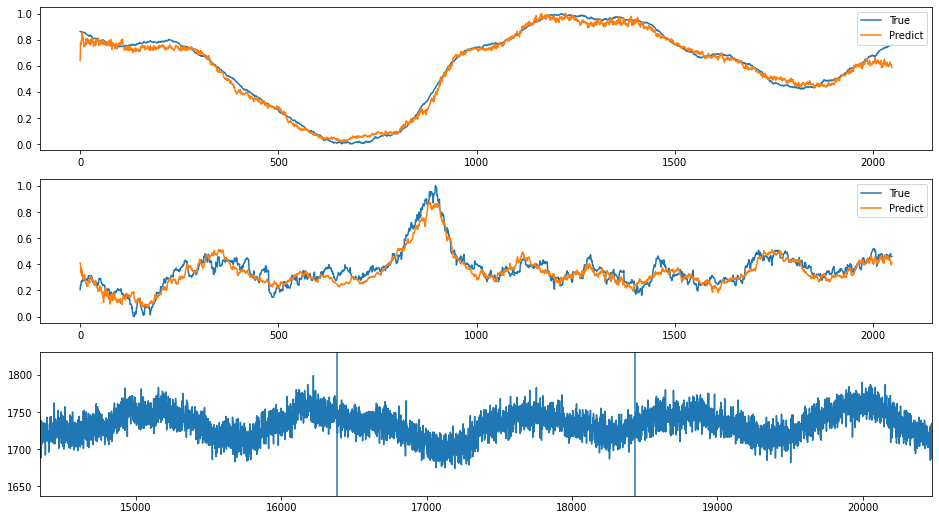

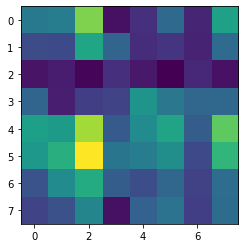

index: 57471
Error: 0.002029916964533881
type                                                         Inst
fill                                                         6272
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-05 11:11:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6272/...
n_bunches                                                    1836
bunch_index                                                  2986
bunch_number                                                 1590
ts_length                                                   65536
chunk                                                           2
Name: 730, dtype: object


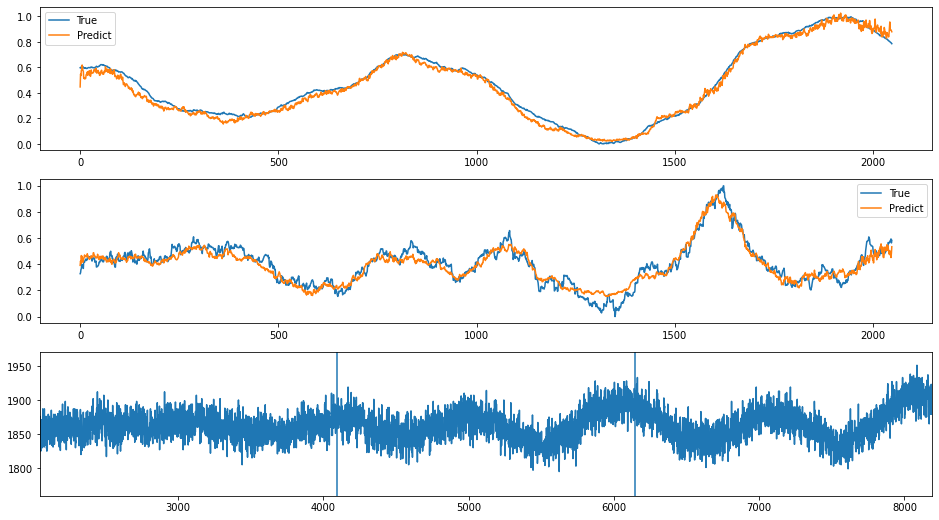

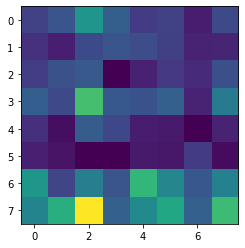

In [25]:
for i in range(10):
    index = sorted_error_indices[i]
    plot_train_index(index)

# From right to left

index: 22220
Error: 0.02765687430323309
type                                                         Inst
fill                                                         7088
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-26 04:25:50
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7088/...
n_bunches                                                     780
bunch_index                                                   800
bunch_number                                                  574
ts_length                                                   65536
chunk                                                          10
Name: 2607, dtype: object


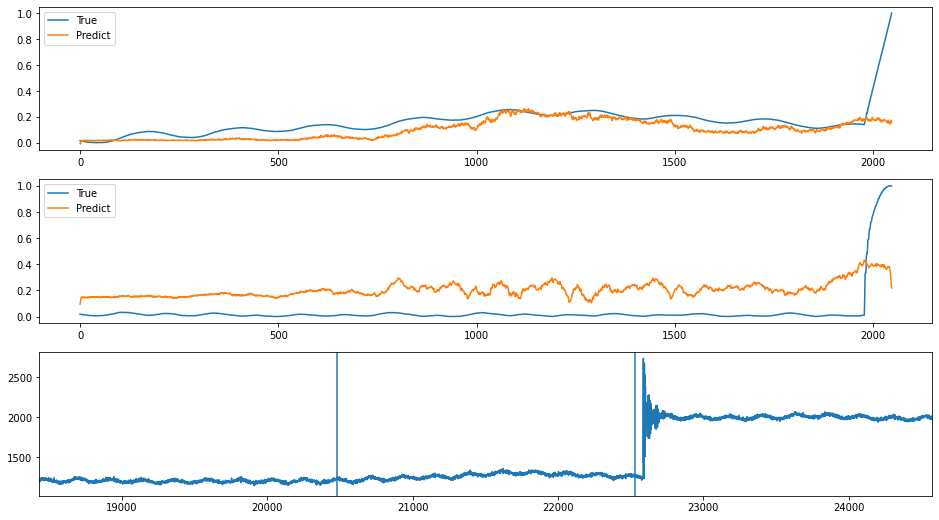

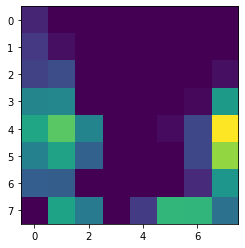

index: 45695
Error: 0.02707955578967482
type                                                         Inst
fill                                                         6922
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-14 18:34:26
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6922/...
n_bunches                                                     108
bunch_index                                                    74
bunch_number                                                   25
ts_length                                                   65536
chunk                                                          11
Name: 2932, dtype: object


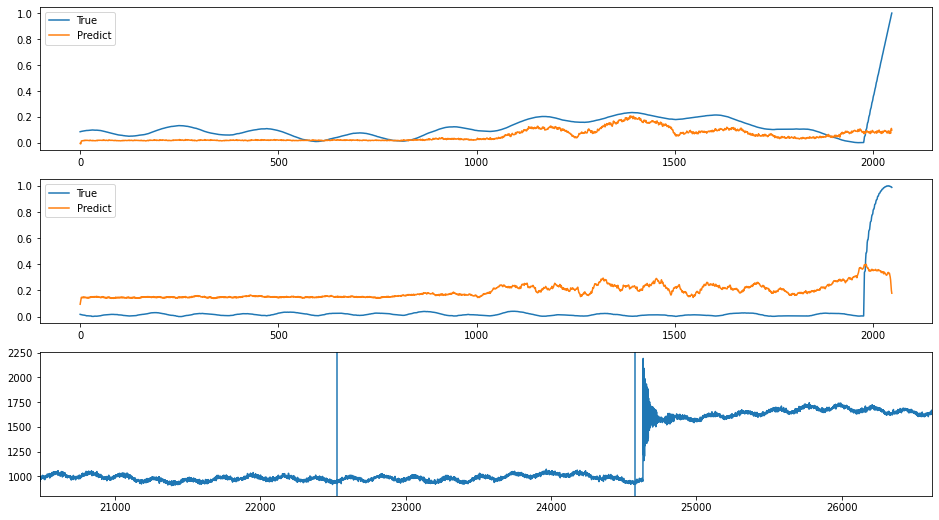

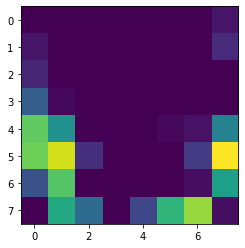

index: 161222
Error: 0.0254761118948617
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                    23
bunch_number                                                    5
ts_length                                                   65536
chunk                                                           4
Name: 1155, dtype: object


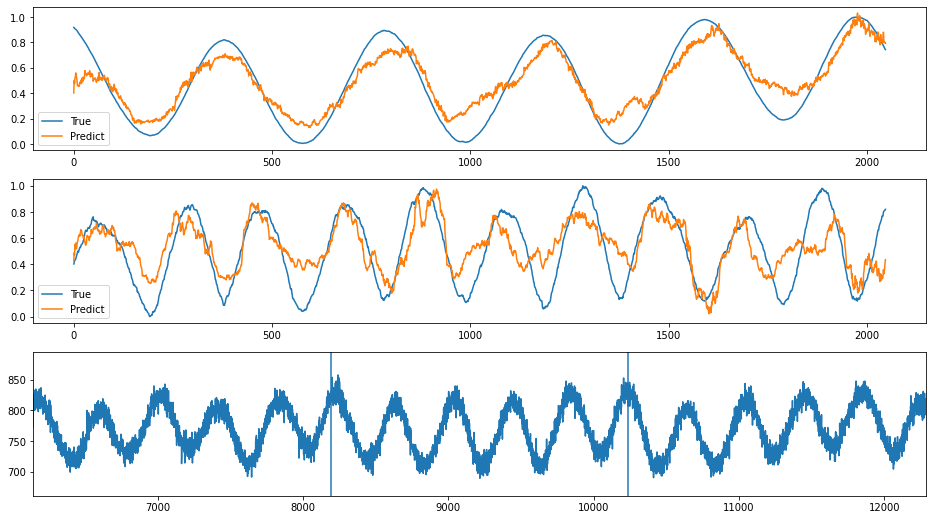

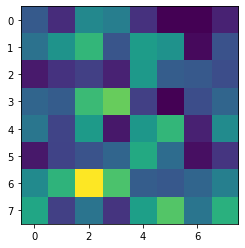

index: 150899
Error: 0.02531475781959984
type                                                         Inst
fill                                                         6347
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-30 11:39:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6347/...
n_bunches                                                    1868
bunch_index                                                   136
bunch_number                                                   56
ts_length                                                   65536
chunk                                                          19
Name: 4980, dtype: object


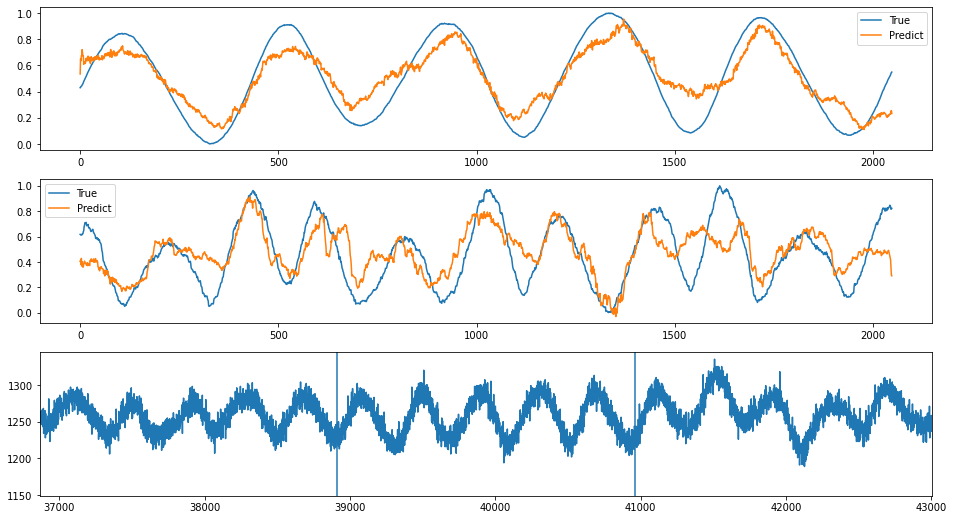

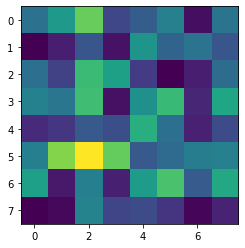

index: 324332
Error: 0.02497875910303261
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   601
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          23
Name: 5950, dtype: object


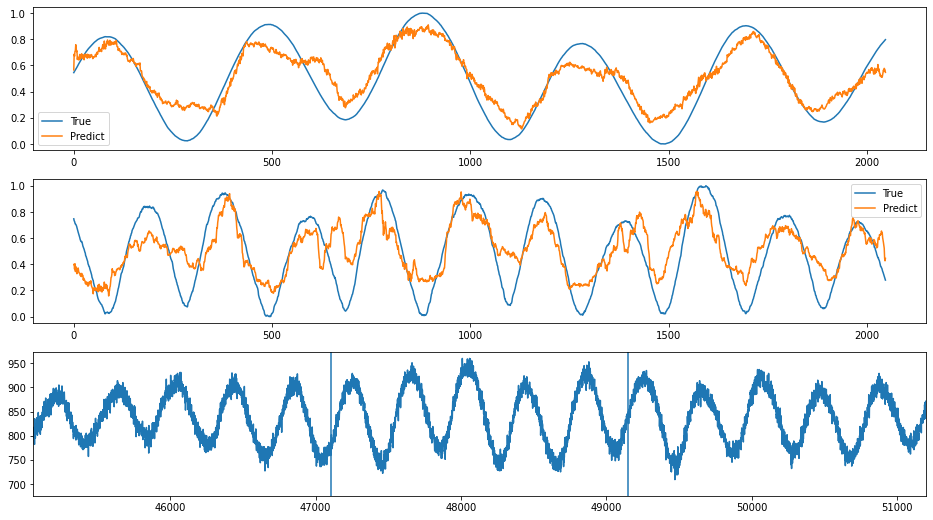

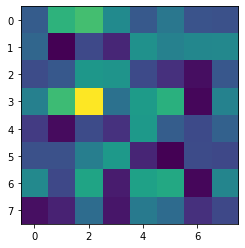

index: 59870
Error: 0.024653969823997653
type                                                         Inst
fill                                                         7055
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-14 16:02:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7055/...
n_bunches                                                     924
bunch_index                                                   789
bunch_number                                                  563
ts_length                                                   65536
chunk                                                          11
Name: 2856, dtype: object


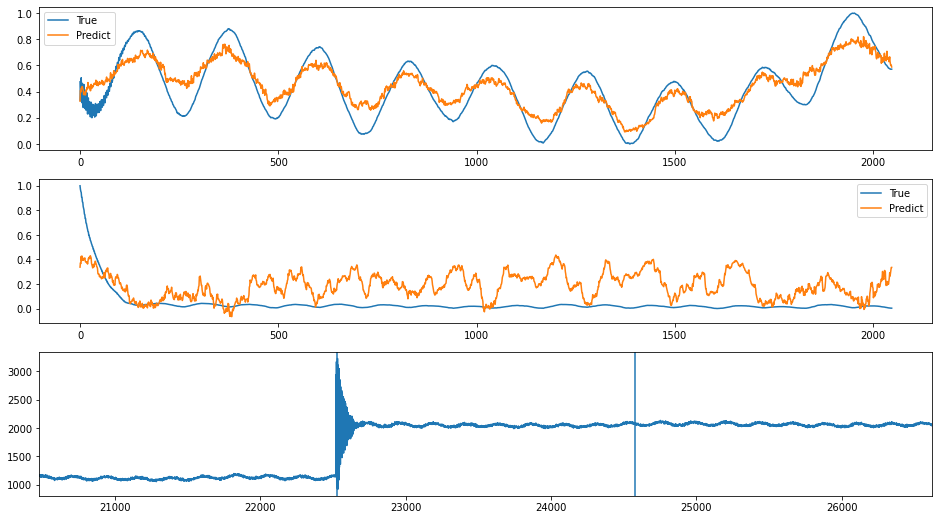

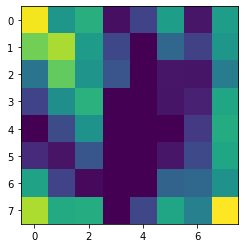

index: 287802
Error: 0.024420519806279635
type                                                         Inst
fill                                                         6757
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-04 04:22:47
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6757/...
n_bunches                                                    1068
bunch_index                                                   363
bunch_number                                                  243
ts_length                                                   65536
chunk                                                           9
Name: 2521, dtype: object


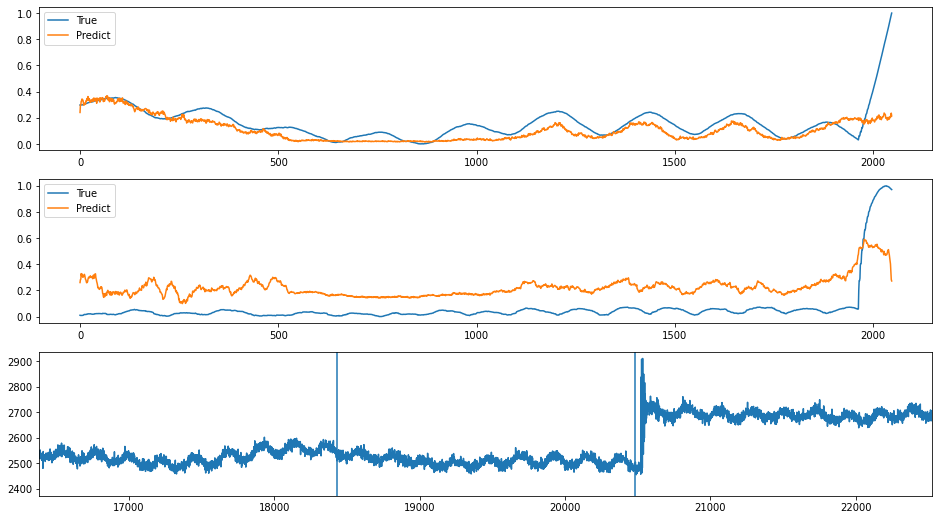

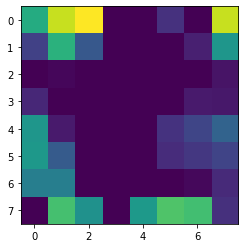

index: 161742
Error: 0.024340282432892334
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                    23
bunch_number                                                    5
ts_length                                                   65536
chunk                                                           6
Name: 1667, dtype: object


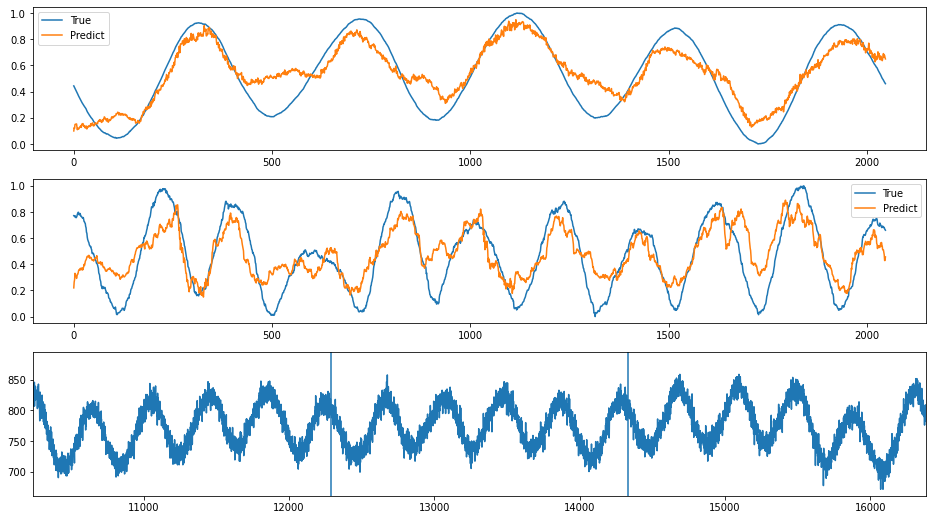

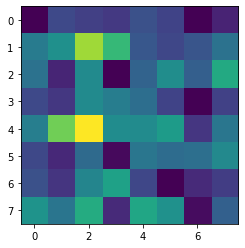

index: 160829
Error: 0.023696818660259543
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                    23
bunch_number                                                    5
ts_length                                                   65536
chunk                                                           2
Name: 643, dtype: object


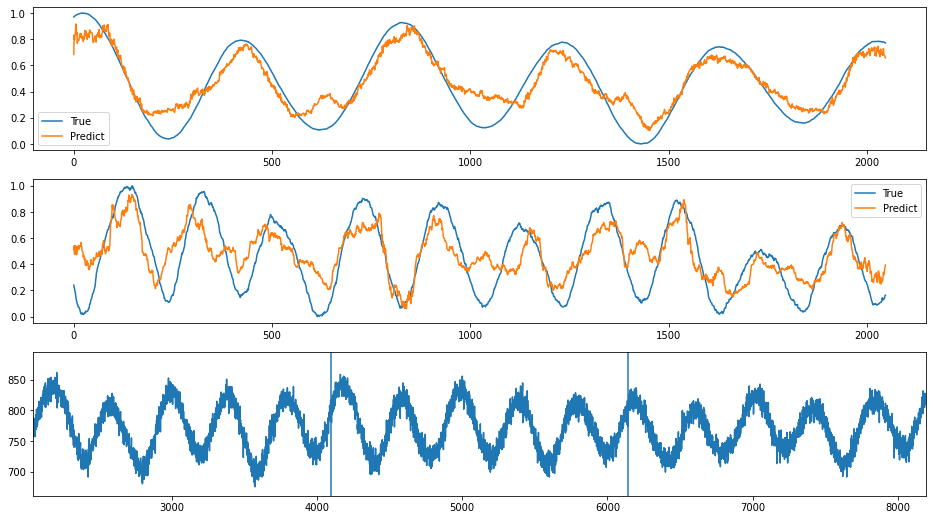

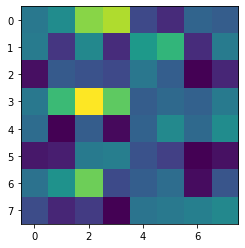

index: 161206
Error: 0.023679753553022584
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          29
Name: 7655, dtype: object


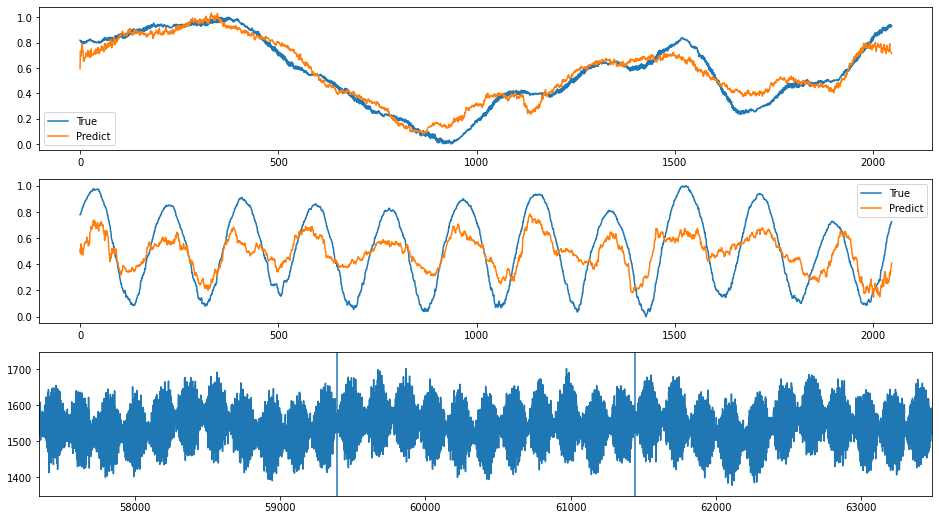

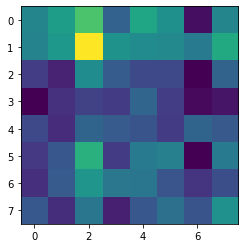

index: 311563
Error: 0.023278050350041074
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 06:42:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  2952
bunch_number                                                 1629
ts_length                                                   65536
chunk                                                          19
Name: 5102, dtype: object


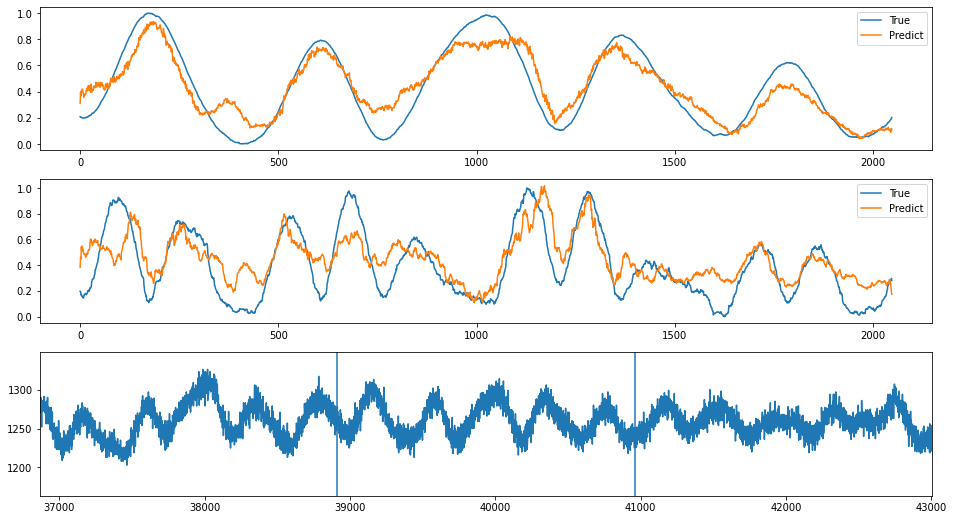

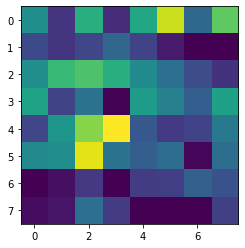

index: 218859
Error: 0.023170442418086815
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:57:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                   959
bunch_number                                                   64
ts_length                                                   65536
chunk                                                          25
Name: 6602, dtype: object


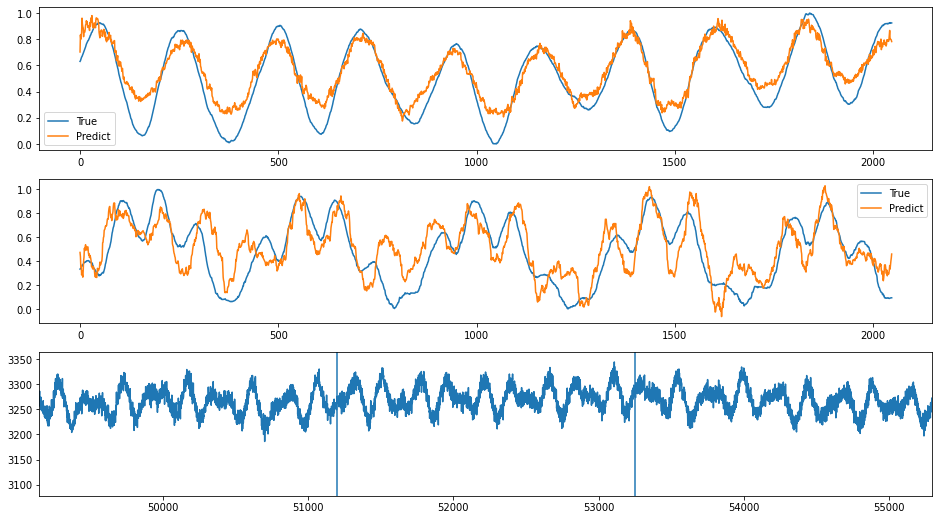

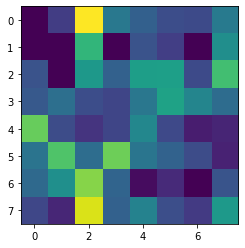

index: 85860
Error: 0.02314399687740073
type                                                         Inst
fill                                                         7056
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-15 03:02:11
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7056/...
n_bunches                                                     636
bunch_index                                                   811
bunch_number                                                  585
ts_length                                                   65536
chunk                                                           9
Name: 2374, dtype: object


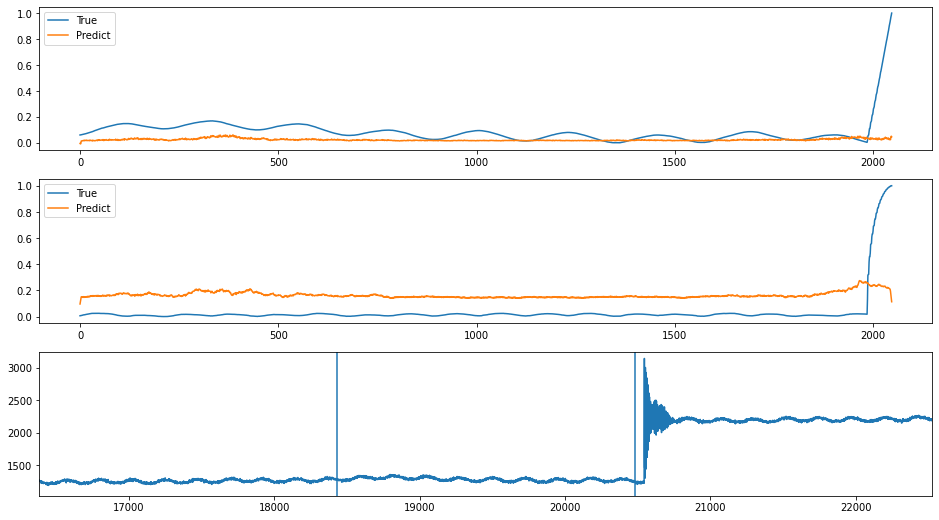

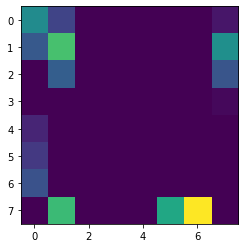

index: 164613
Error: 0.0231307753051454
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          13
Name: 3559, dtype: object


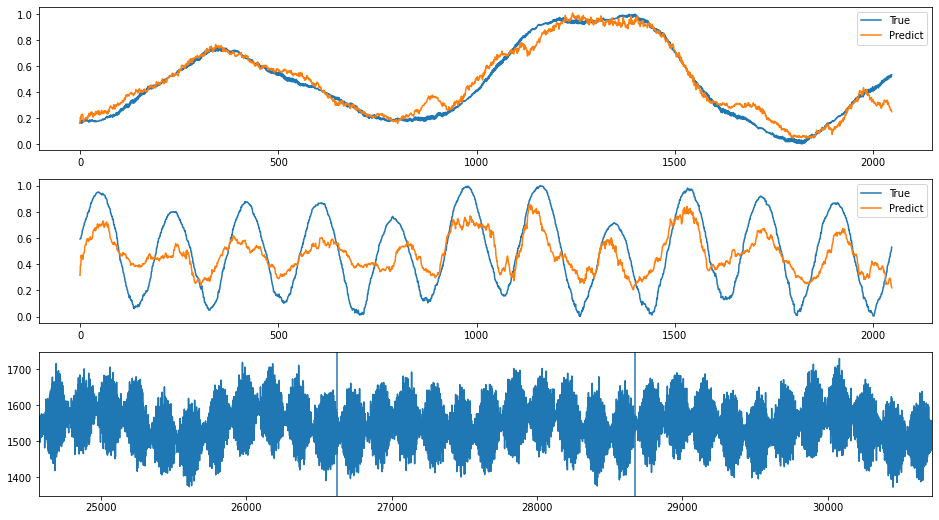

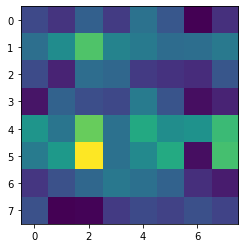

index: 158895
Error: 0.023122483131429568
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          26
Name: 6887, dtype: object


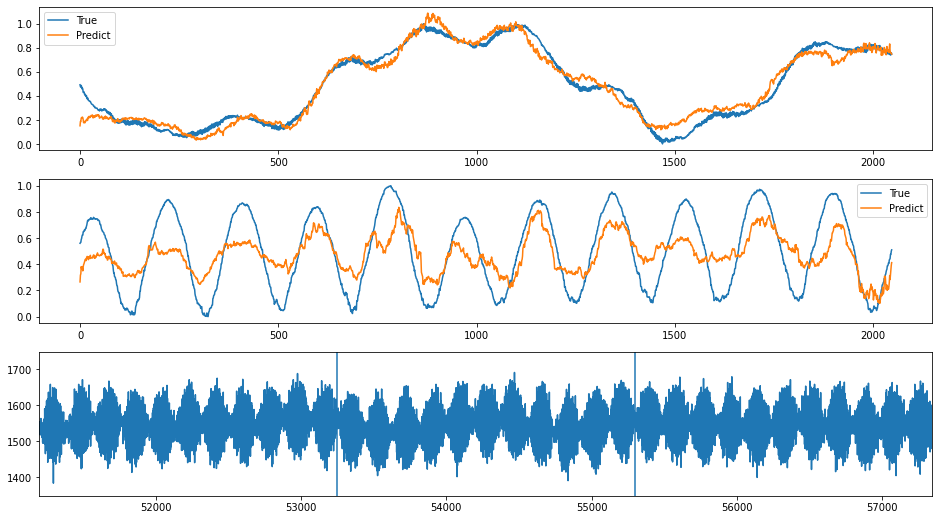

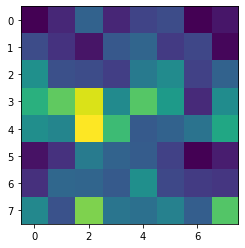

index: 159272
Error: 0.023077586175577765
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          14
Name: 3815, dtype: object


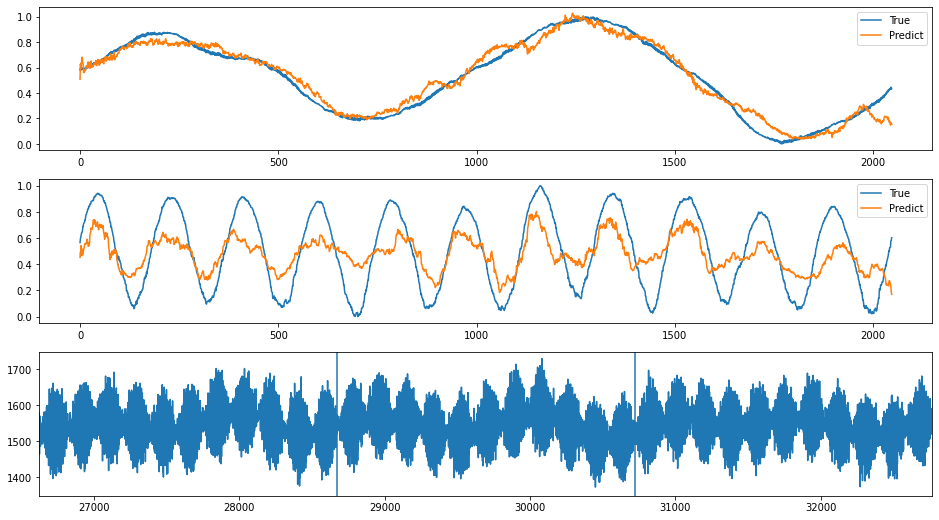

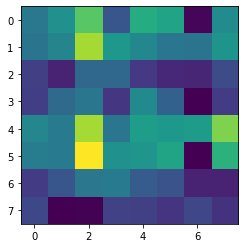

index: 122681
Error: 0.023035932711037058
type                                                         Inst
fill                                                         6797
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 00:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6797/...
n_bunches                                                     158
bunch_index                                                   378
bunch_number                                                  122
ts_length                                                   65536
chunk                                                          30
Name: 7790, dtype: object


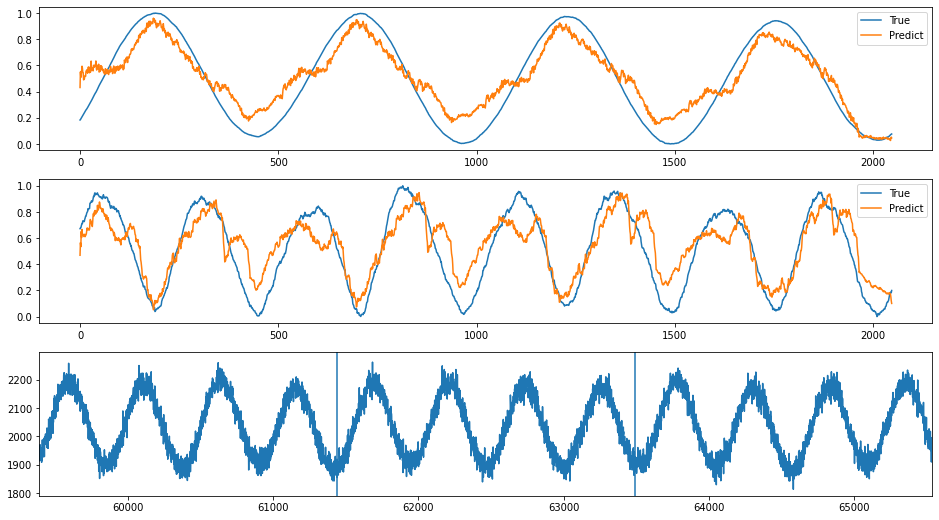

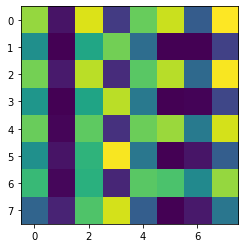

index: 163211
Error: 0.022925350905392477
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          21
Name: 5607, dtype: object


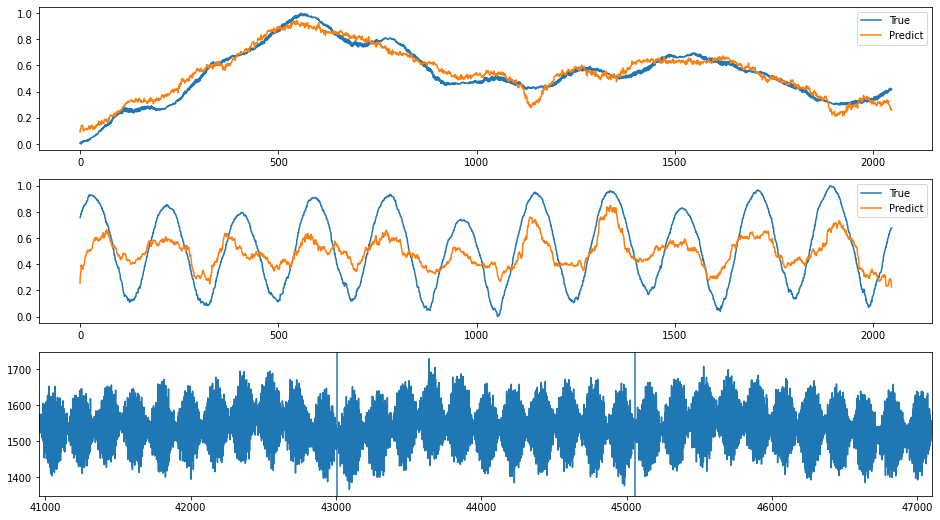

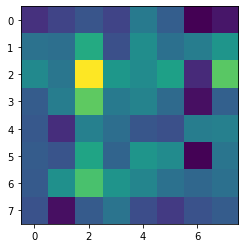

index: 120967
Error: 0.022924304496608133
type                                                         Inst
fill                                                         6797
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 00:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6797/...
n_bunches                                                     158
bunch_index                                                   378
bunch_number                                                  122
ts_length                                                   65536
chunk                                                          14
Name: 3694, dtype: object


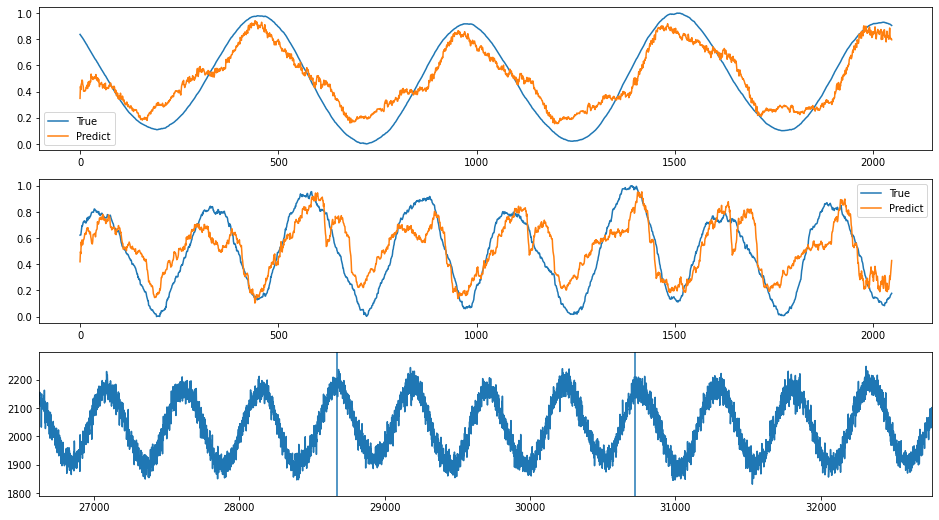

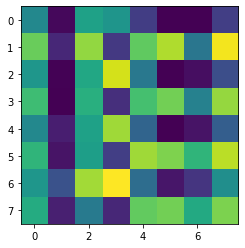

index: 115996
Error: 0.02274101785786516
type                                                         Inst
fill                                                         6215
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-16 23:28:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6215/...
n_bunches                                                     923
bunch_index                                                  1227
bunch_number                                                  909
ts_length                                                   65536
chunk                                                           4
Name: 1262, dtype: object


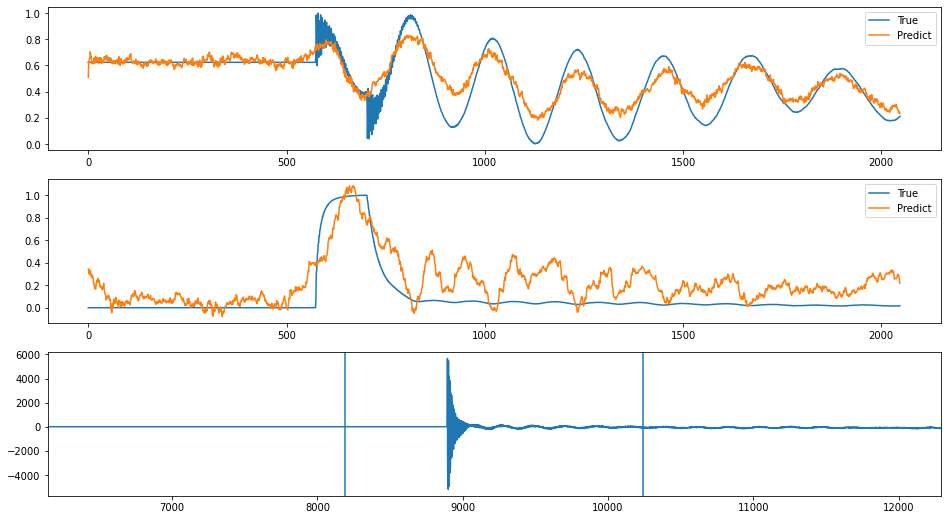

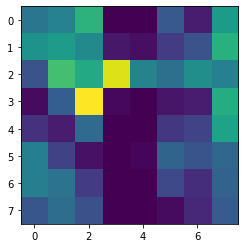

index: 160464
Error: 0.022696898482301966
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          18
Name: 4839, dtype: object


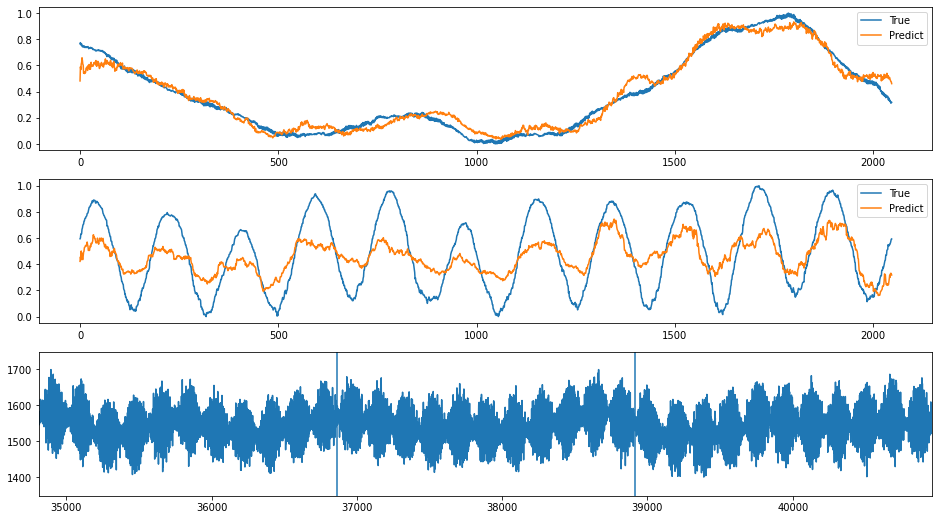

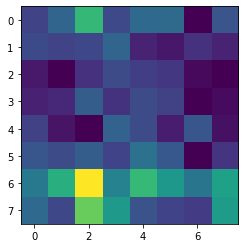

index: 353193
Error: 0.02267013409425521
type                                                         Inst
fill                                                         6799
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 07:45:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6799/...
n_bunches                                                     157
bunch_index                                                   403
bunch_number                                                  146
ts_length                                                   65536
chunk                                                          21
Name: 5465, dtype: object


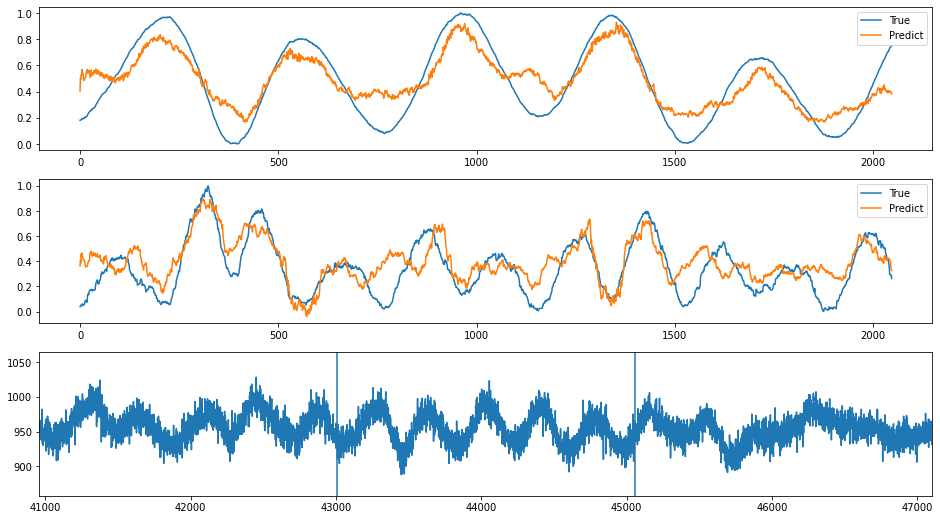

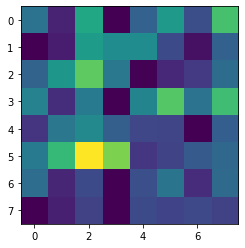

index: 159779
Error: 0.022397443558914817
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                           3
Name: 999, dtype: object


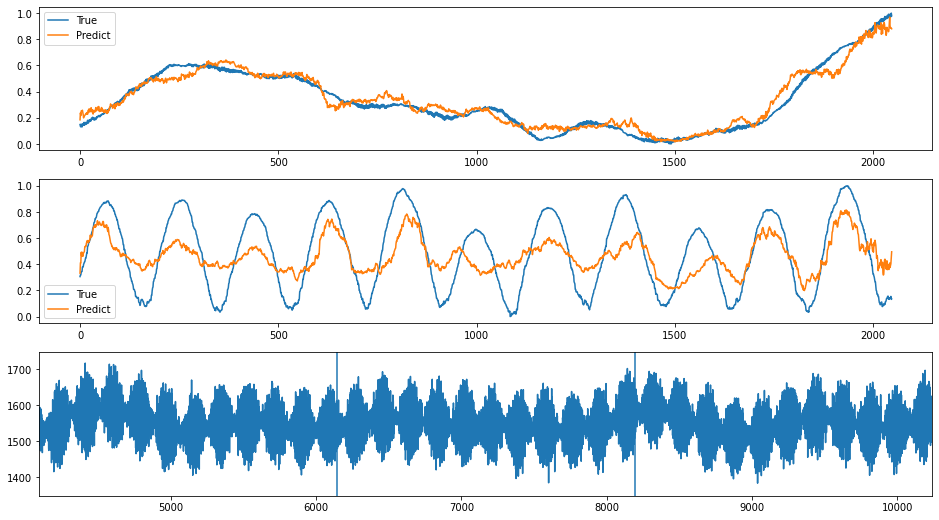

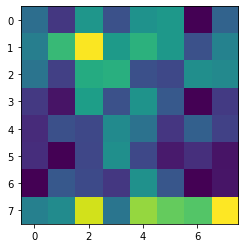

index: 162968
Error: 0.022387283204586186
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          20
Name: 5351, dtype: object


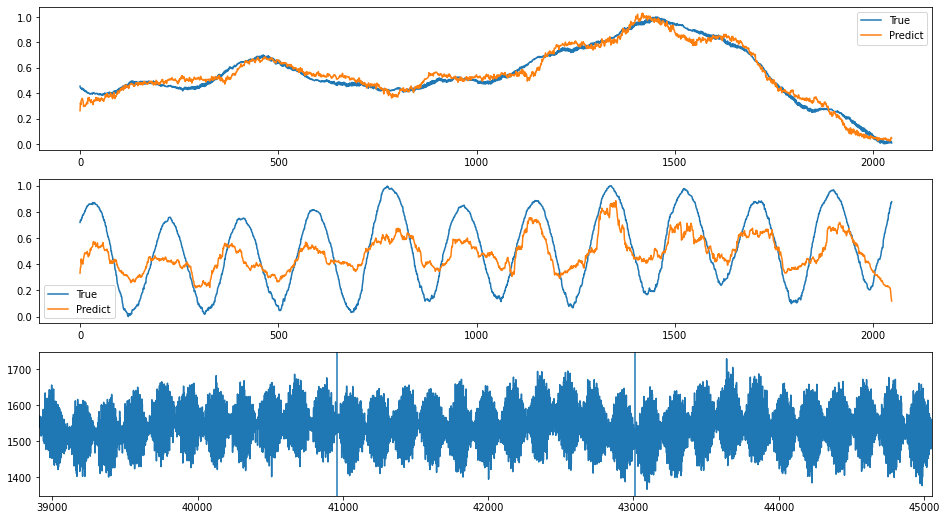

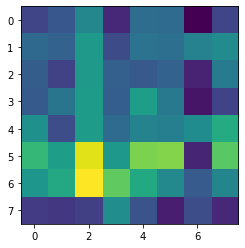

index: 363487
Error: 0.02228752380308681
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:04:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   632
bunch_number                                                  352
ts_length                                                   65536
chunk                                                           4
Name: 1098, dtype: object


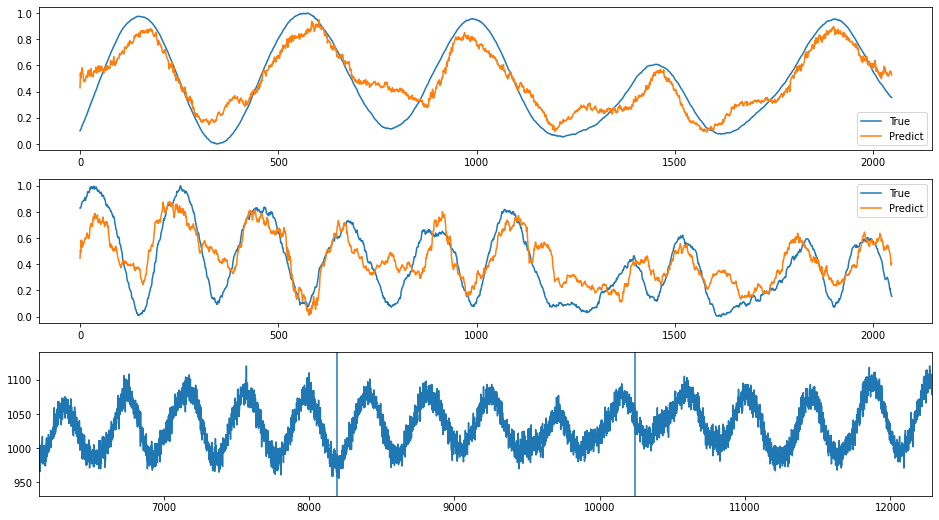

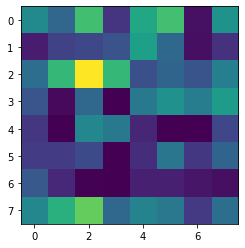

index: 317869
Error: 0.022227571835140868
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   601
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          24
Name: 6206, dtype: object


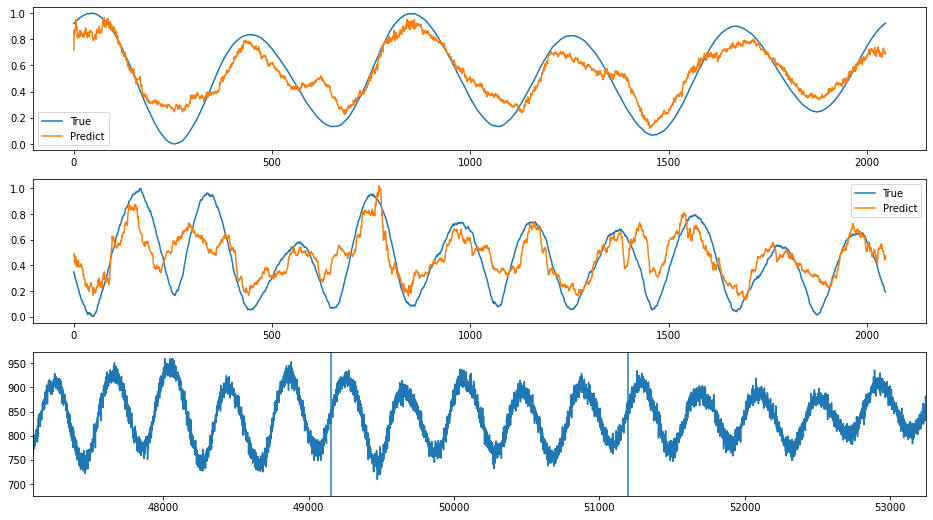

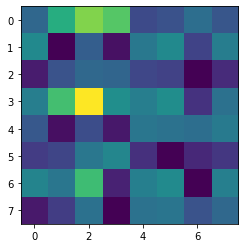

index: 165831
Error: 0.021960555874661454
type                                                         Inst
fill                                                         6404
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-21 17:11:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6404/...
n_bunches                                                     656
bunch_index                                                   478
bunch_number                                                  107
ts_length                                                   65536
chunk                                                          15
Name: 3960, dtype: object


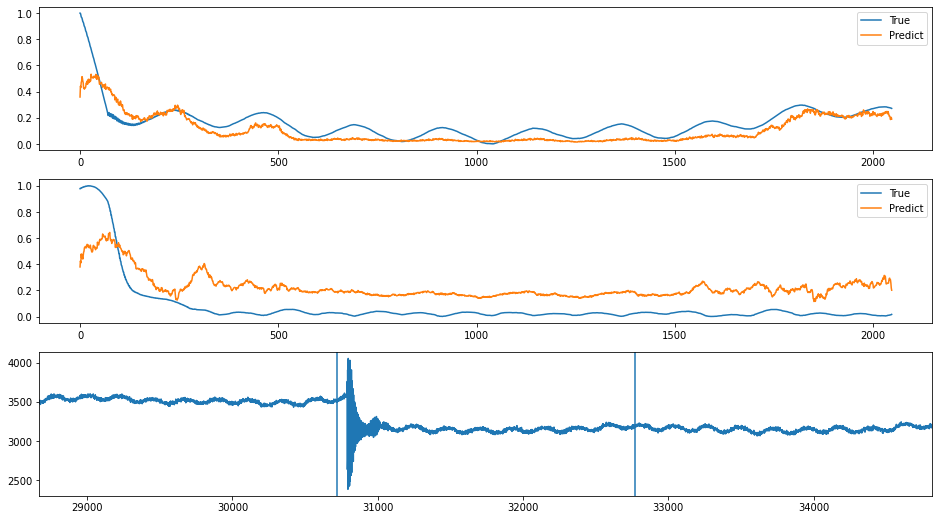

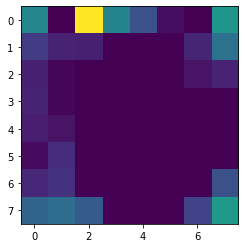

index: 55339
Error: 0.02188873736992472
type                                                         Inst
fill                                                         6399
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-20 12:33:55
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6399/...
n_bunches                                                     908
bunch_index                                                  2047
bunch_number                                                  879
ts_length                                                   65536
chunk                                                           5
Name: 1336, dtype: object


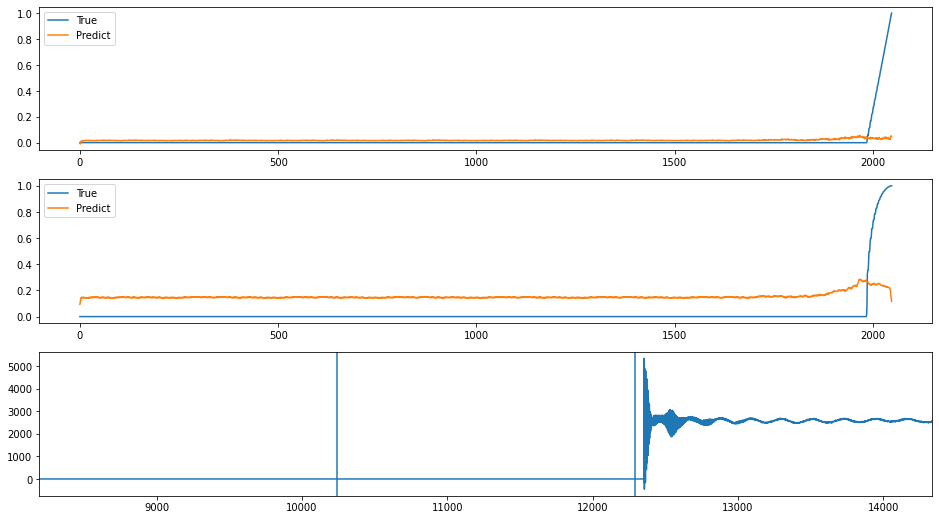

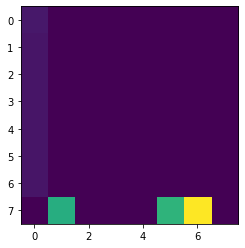

index: 321233
Error: 0.021844611167164782
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   601
bunch_number                                                  328
ts_length                                                   65536
chunk                                                           2
Name: 574, dtype: object


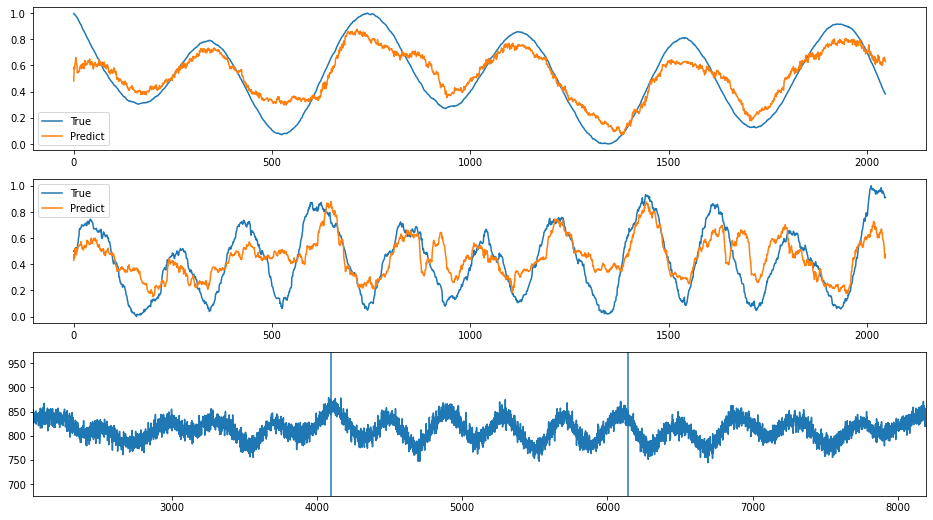

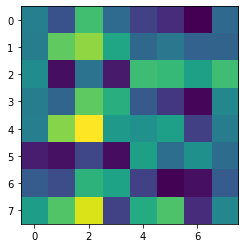

index: 139055
Error: 0.021774859053201756
type                                                         Inst
fill                                                         7033
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-07 03:58:04
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7033/...
n_bunches                                                     780
bunch_index                                                   846
bunch_number                                                  613
ts_length                                                   65536
chunk                                                           9
Name: 2359, dtype: object


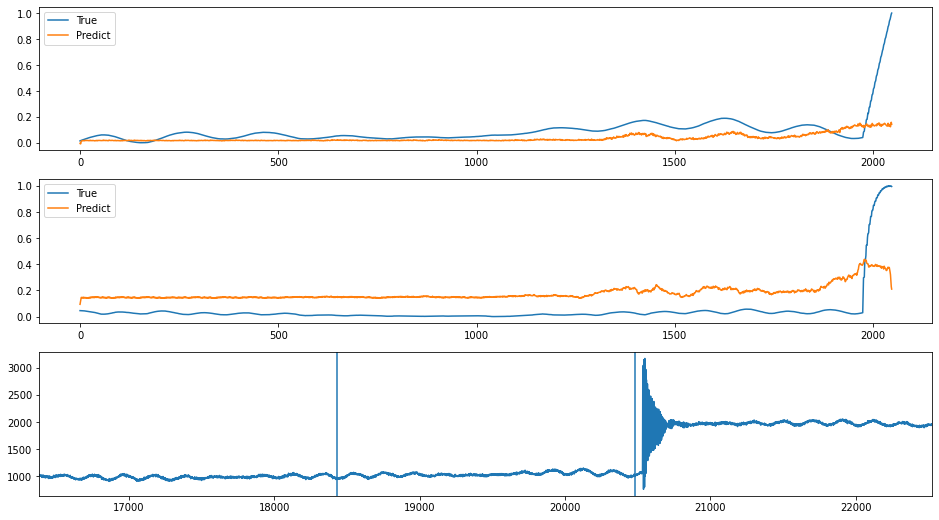

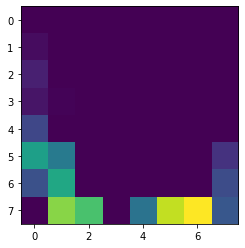

index: 89157
Error: 0.021439931631319402
type                                                         Inst
fill                                                         7144
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-09 16:55:01
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7144/...
n_bunches                                                     780
bunch_index                                                   263
bunch_number                                                  169
ts_length                                                   65536
chunk                                                          11
Name: 2839, dtype: object


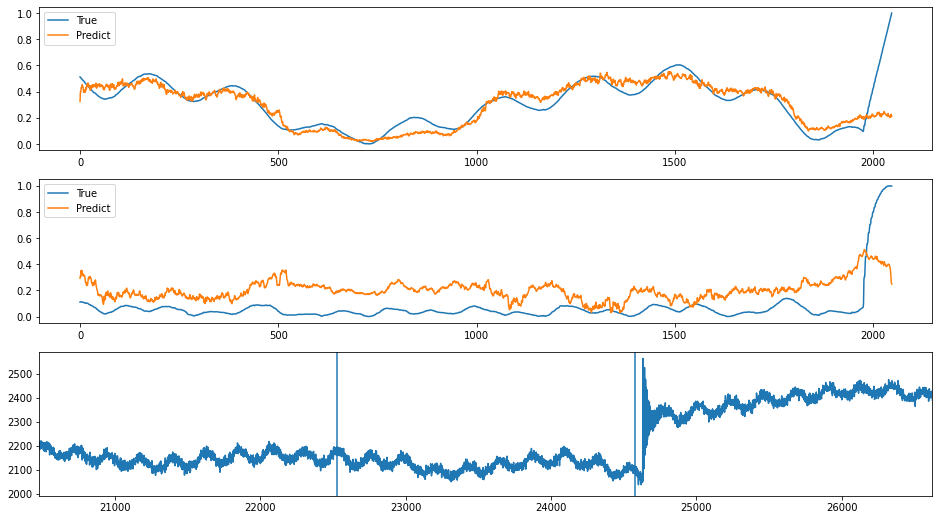

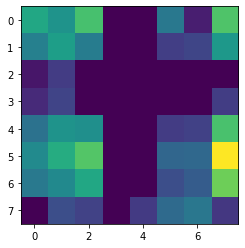

index: 161704
Error: 0.021317372041428223
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                          23
Name: 6119, dtype: object


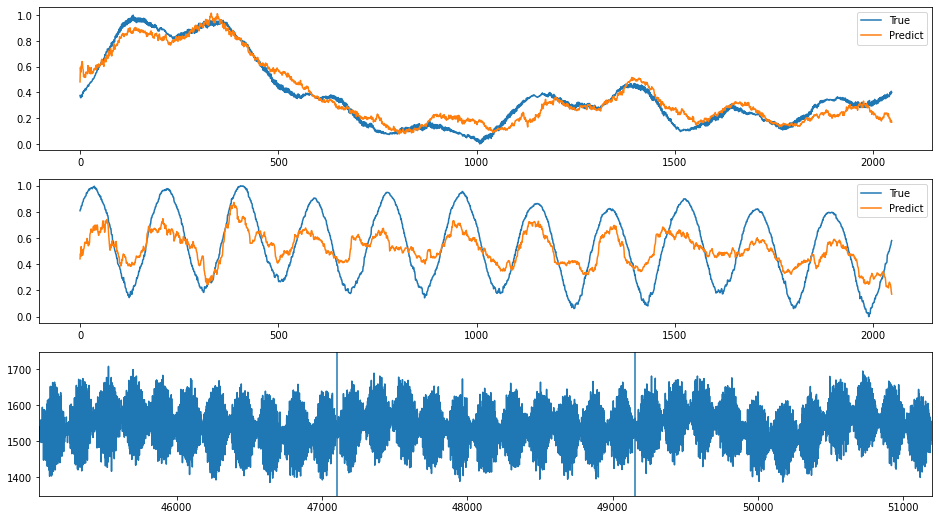

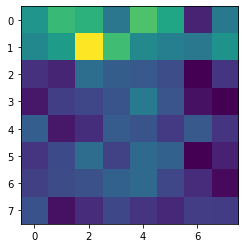

index: 125816
Error: 0.021229361195324134
type                                                         Inst
fill                                                         6797
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 00:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6797/...
n_bunches                                                     158
bunch_index                                                   378
bunch_number                                                  122
ts_length                                                   65536
chunk                                                          24
Name: 6254, dtype: object


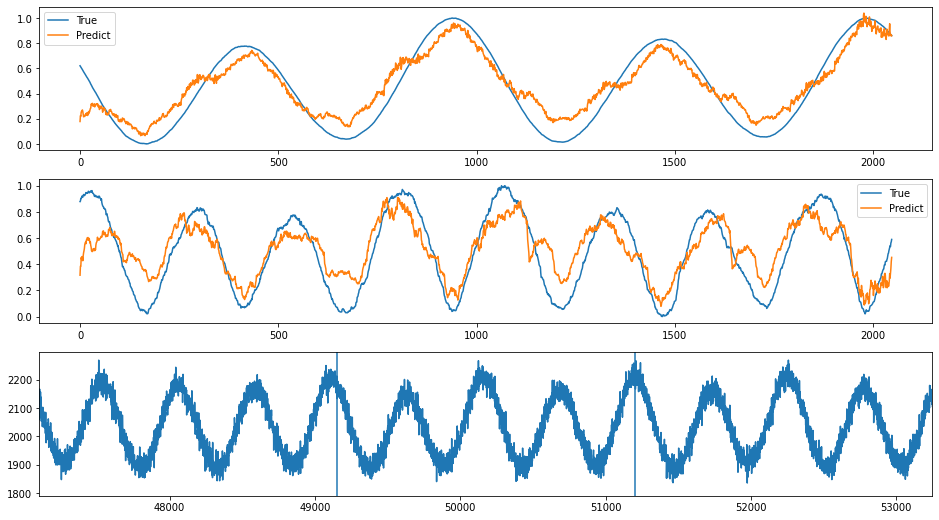

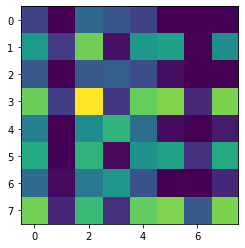

index: 169529
Error: 0.021177228858549987
type                                                         Inst
fill                                                         6344
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-28 21:05:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6344/...
n_bunches                                                      12
bunch_index                                                    11
bunch_number                                                   11
ts_length                                                   65536
chunk                                                          11
Name: 2873, dtype: object


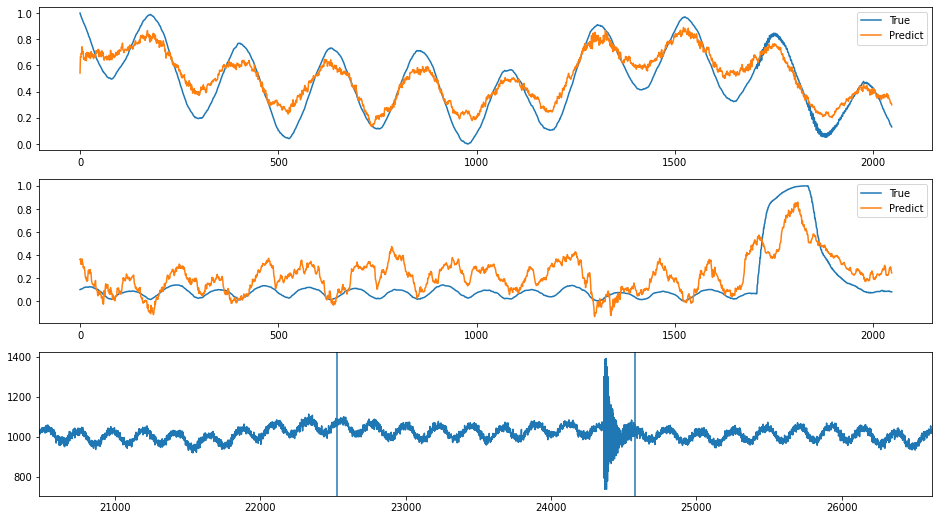

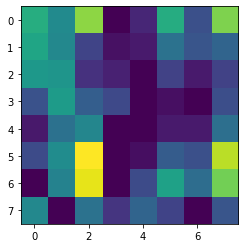

index: 29967
Error: 0.021034914053863776
type                                                         Inst
fill                                                         7015
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-03 06:19:05
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7015/...
n_bunches                                                     636
bunch_index                                                   629
bunch_number                                                  445
ts_length                                                   65536
chunk                                                          14
Name: 3594, dtype: object


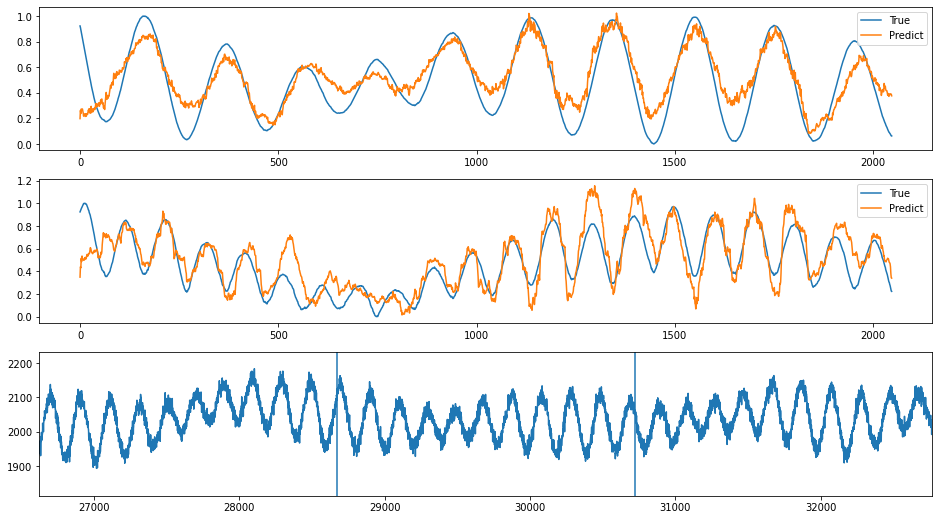

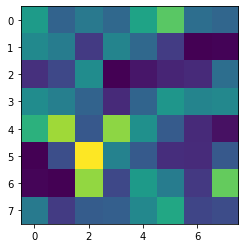

index: 164575
Error: 0.0210273996738655
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                    23
bunch_number                                                    5
ts_length                                                   65536
chunk                                                           5
Name: 1411, dtype: object


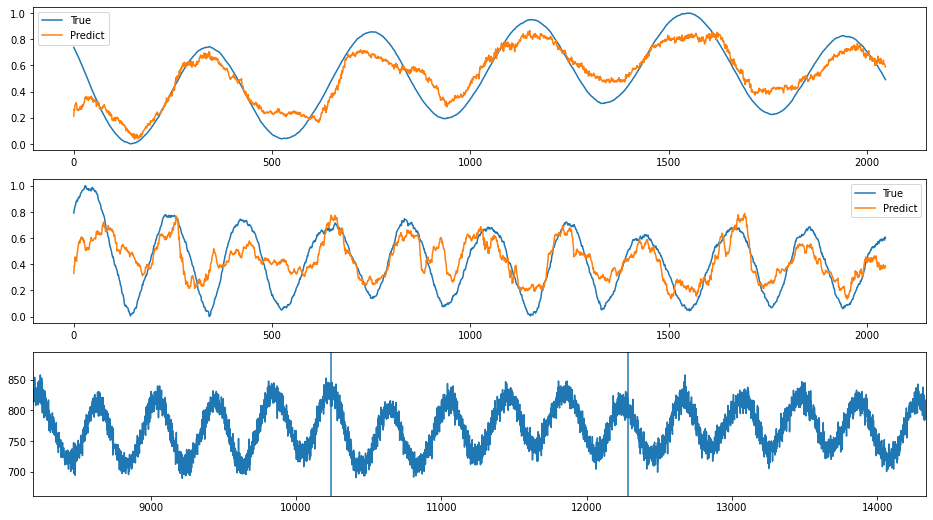

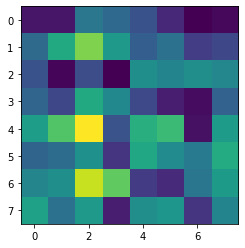

index: 164898
Error: 0.020991425729489345
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                    23
bunch_number                                                    5
ts_length                                                   65536
chunk                                                           3
Name: 899, dtype: object


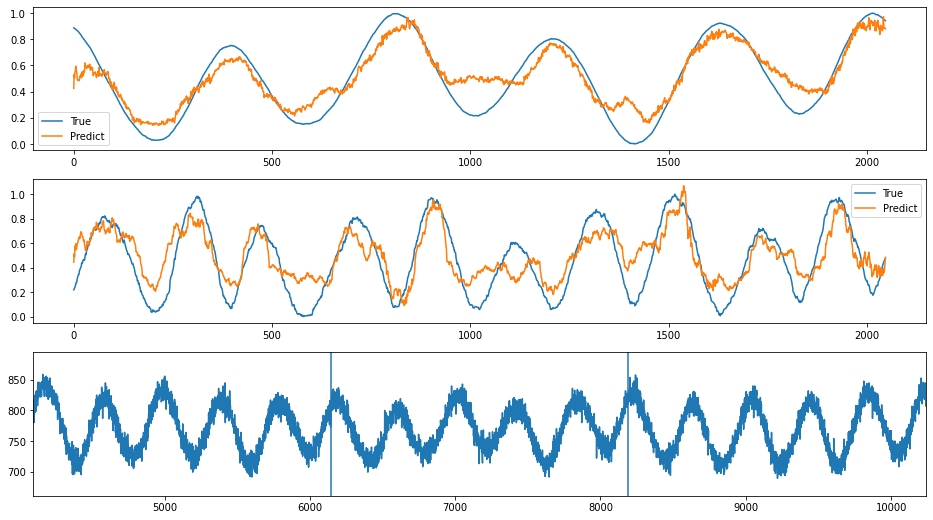

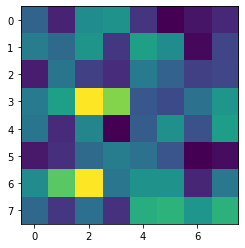

index: 359321
Error: 0.02093280278323248
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:04:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   632
bunch_number                                                  352
ts_length                                                   65536
chunk                                                           6
Name: 1610, dtype: object


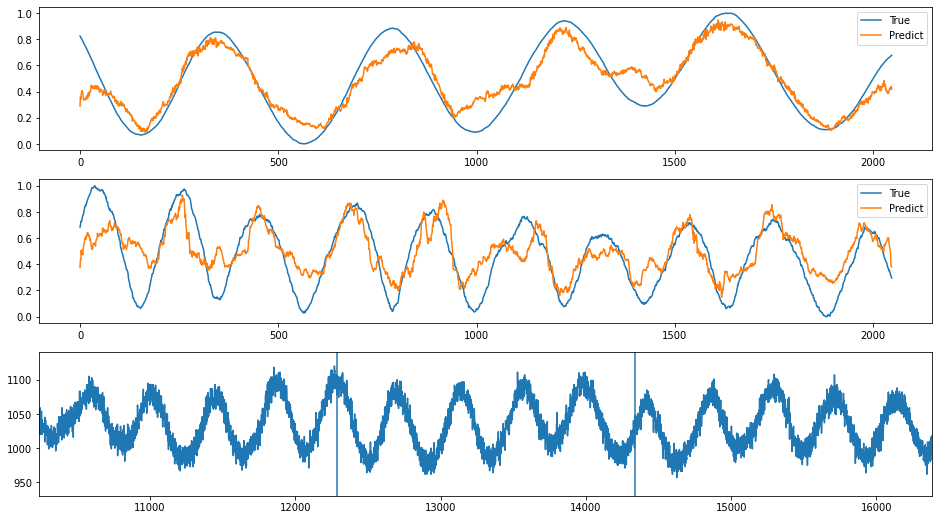

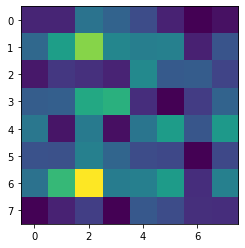

index: 317754
Error: 0.020919775755501007
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   601
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          21
Name: 5438, dtype: object


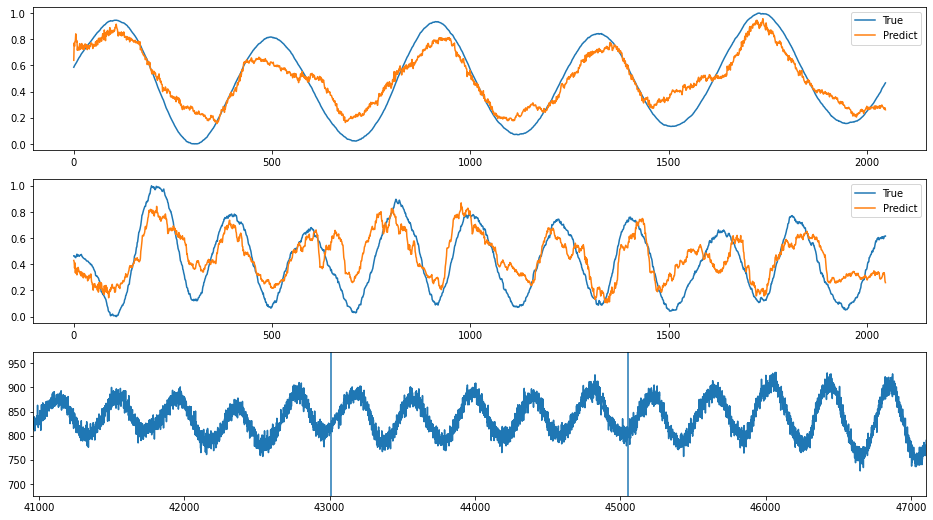

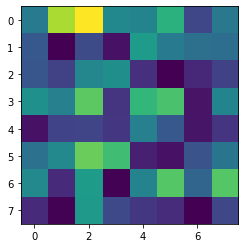

index: 66763
Error: 0.020911421849744857
type                                                         Inst
fill                                                         7380
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:10:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7380/...
n_bunches                                                     156
bunch_index                                                  1054
bunch_number                                                  152
ts_length                                                   65536
chunk                                                          24
Name: 6219, dtype: object


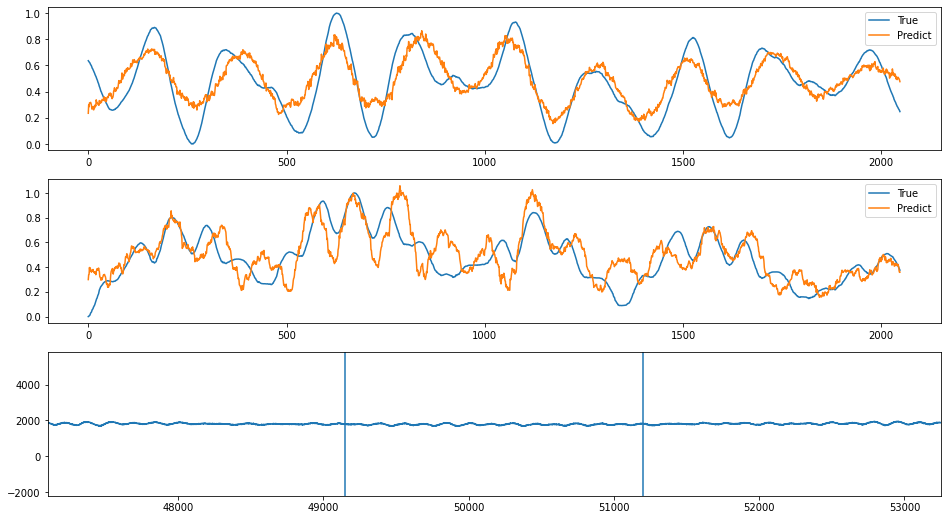

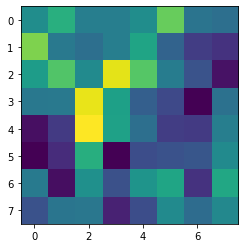

index: 121776
Error: 0.02086837953188752
type                                                         Inst
fill                                                         6797
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 00:00:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6797/...
n_bunches                                                     158
bunch_index                                                   378
bunch_number                                                  122
ts_length                                                   65536
chunk                                                          13
Name: 3438, dtype: object


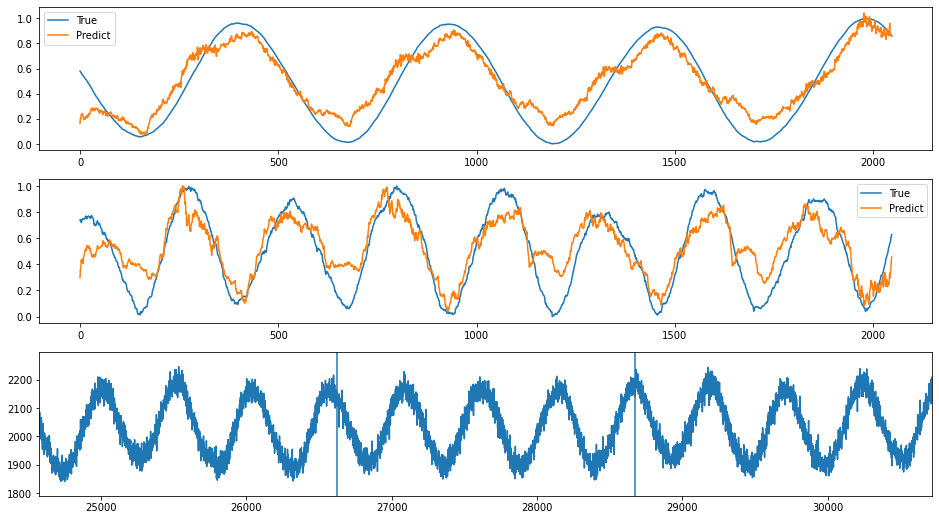

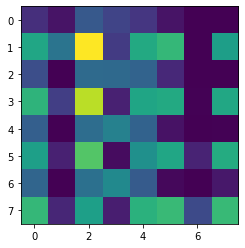

index: 115283
Error: 0.02078408168070059
type                                                         Inst
fill                                                         6266
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-02 18:19:37
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6266/...
n_bunches                                                     204
bunch_index                                                   280
bunch_number                                                  137
ts_length                                                   65536
chunk                                                           4
Name: 1154, dtype: object


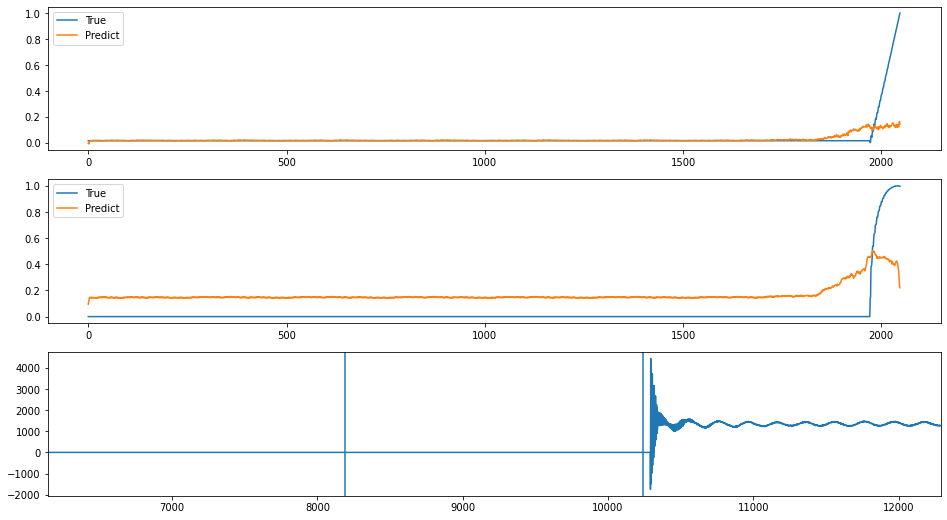

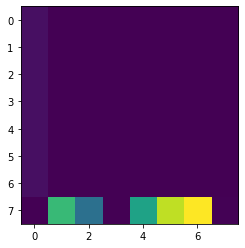

index: 318615
Error: 0.02063798256760558
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   601
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          22
Name: 5694, dtype: object


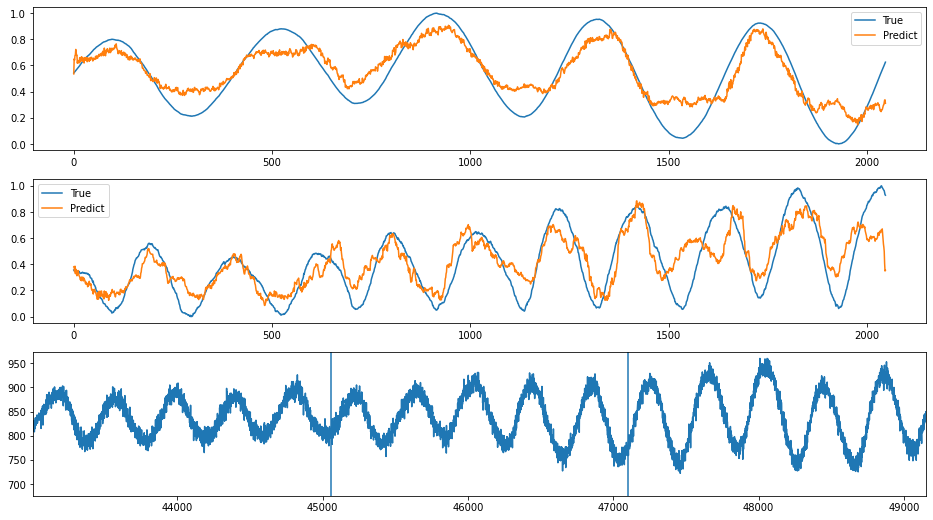

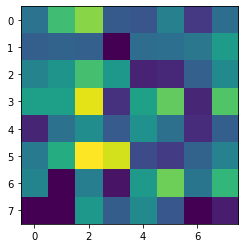

index: 23587
Error: 0.02063301155562703
type                                                         Inst
fill                                                         6692
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-16 17:50:33
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6692/...
n_bunches                                                     637
bunch_index                                                  1194
bunch_number                                                  540
ts_length                                                   65536
chunk                                                          25
Name: 6436, dtype: object


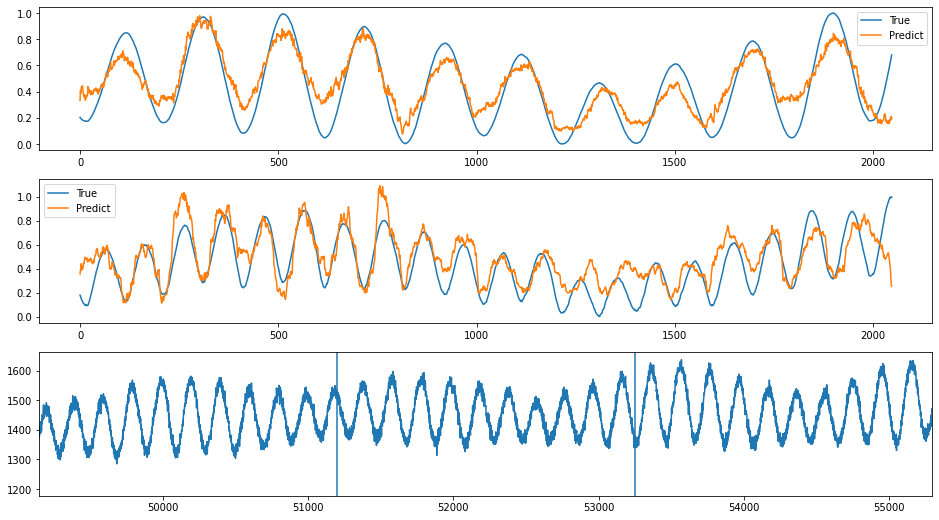

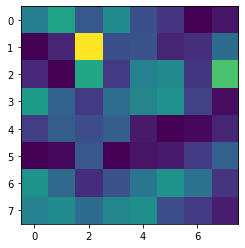

index: 156411
Error: 0.02058250649382569
type                                                         Inst
fill                                                         6347
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-30 11:39:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6347/...
n_bunches                                                    1868
bunch_index                                                   136
bunch_number                                                   56
ts_length                                                   65536
chunk                                                          18
Name: 4724, dtype: object


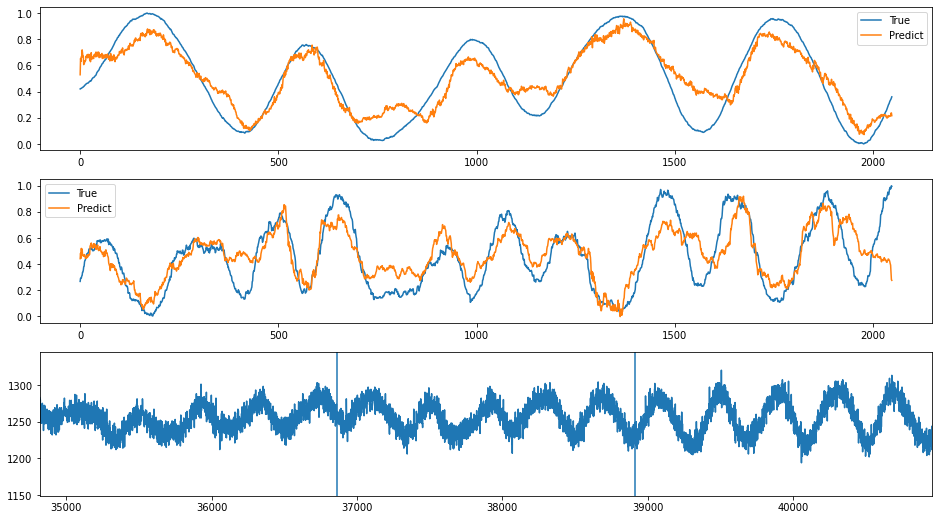

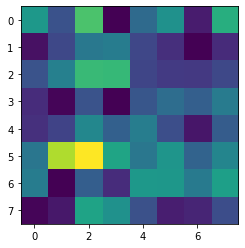

index: 258866
Error: 0.020448622580746766
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 21:31:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  2003
bunch_number                                                 1098
ts_length                                                   65536
chunk                                                           2
Name: 606, dtype: object


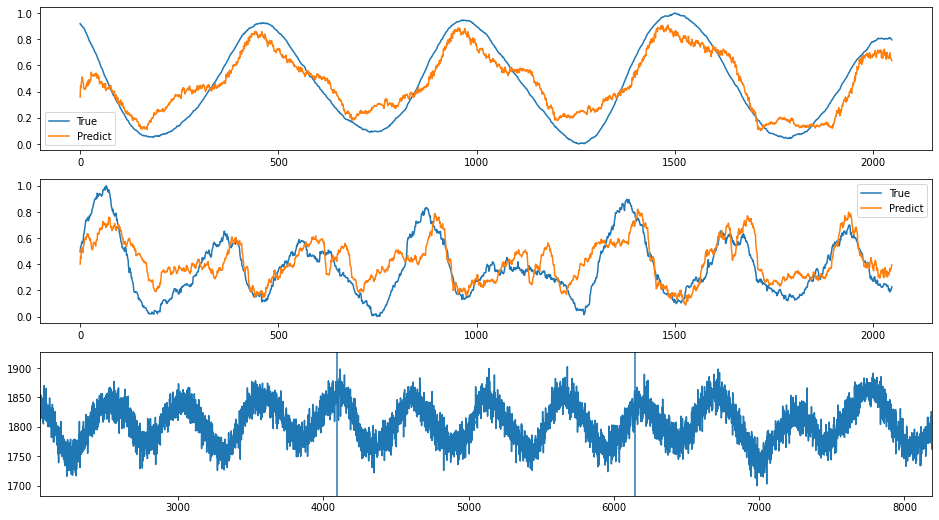

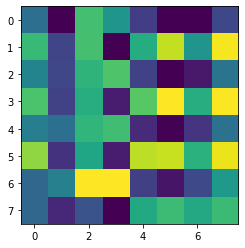

index: 159523
Error: 0.020438622836457032
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:23:00
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   246
bunch_number                                                   59
ts_length                                                   65536
chunk                                                           6
Name: 1767, dtype: object


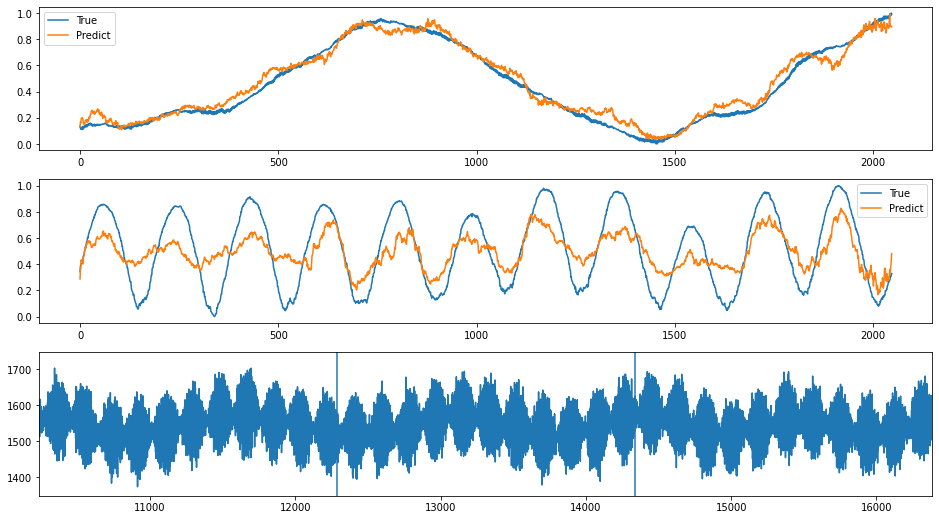

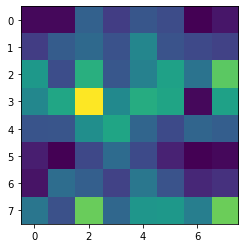

index: 232655
Error: 0.020372223829976225
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 22:26:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  2085
bunch_number                                                 1149
ts_length                                                   65536
chunk                                                           7
Name: 1806, dtype: object


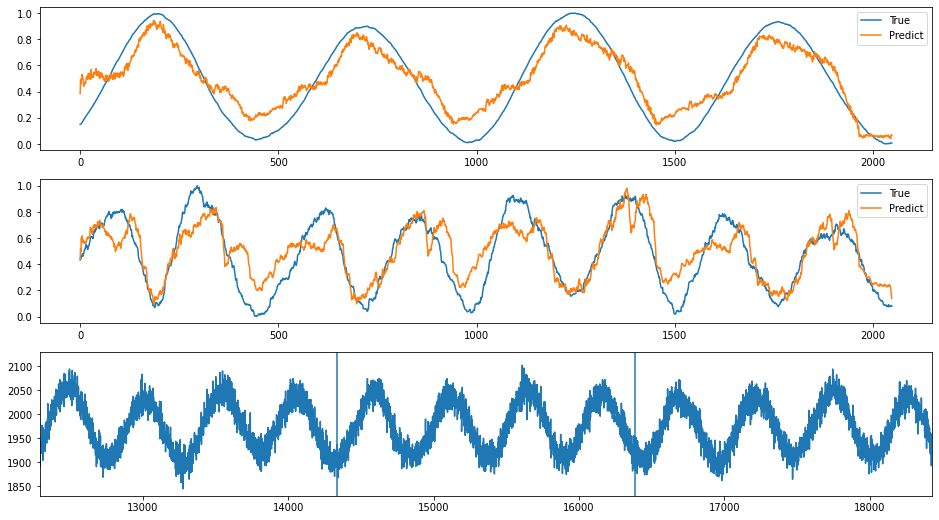

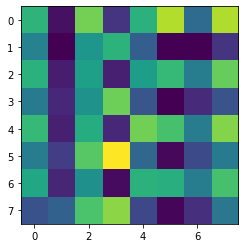

index: 325045
Error: 0.02035026099747034
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   601
bunch_number                                                  328
ts_length                                                   65536
chunk                                                          12
Name: 3134, dtype: object


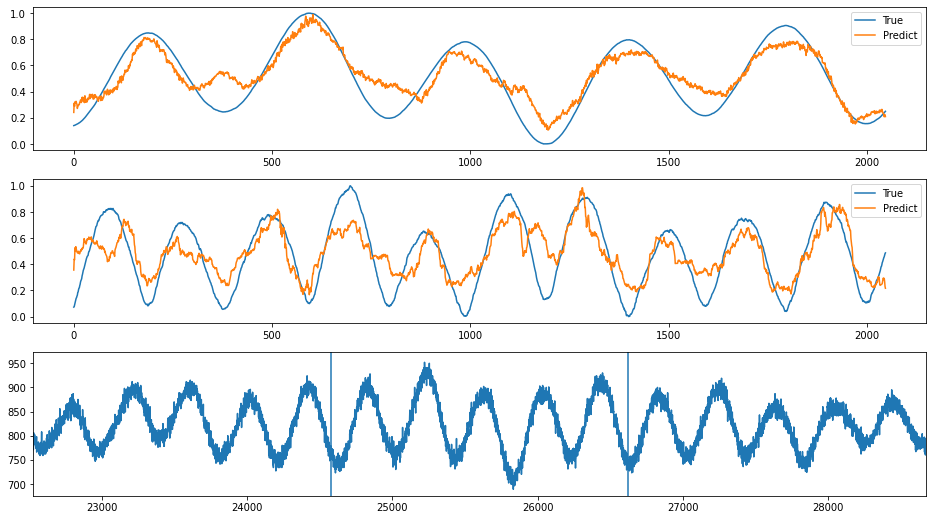

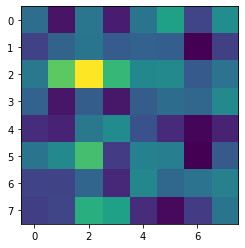

index: 373576
Error: 0.020325569132906285
type                                                         Inst
fill                                                         6640
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-04 08:50:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6640/...
n_bunches                                                     156
bunch_index                                                   167
bunch_number                                                  105
ts_length                                                   65536
chunk                                                          27
Name: 7013, dtype: object


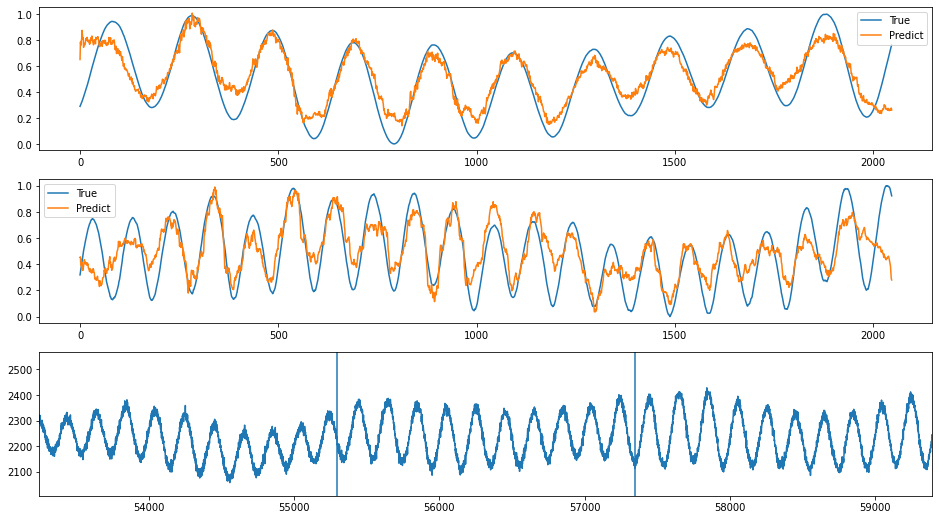

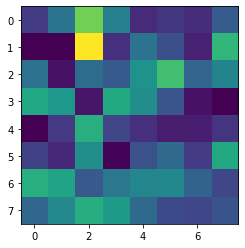

In [26]:
for i in range(1, 51):
    index = sorted_error_indices[-i]
    plot_train_index(index)

# Around the peak

In [27]:
error_around_peak = abs(train_error - hist_peak)
sorted_error_indices_around_peak = np.argsort(error_around_peak)

index: 38178
Error: 0.005145741206111852
type                                                         Inst
fill                                                         6988
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 05:43:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6988/...
n_bunches                                                     444
bunch_index                                                   226
bunch_number                                                   43
ts_length                                                   65536
chunk                                                           3
Name: 848, dtype: object


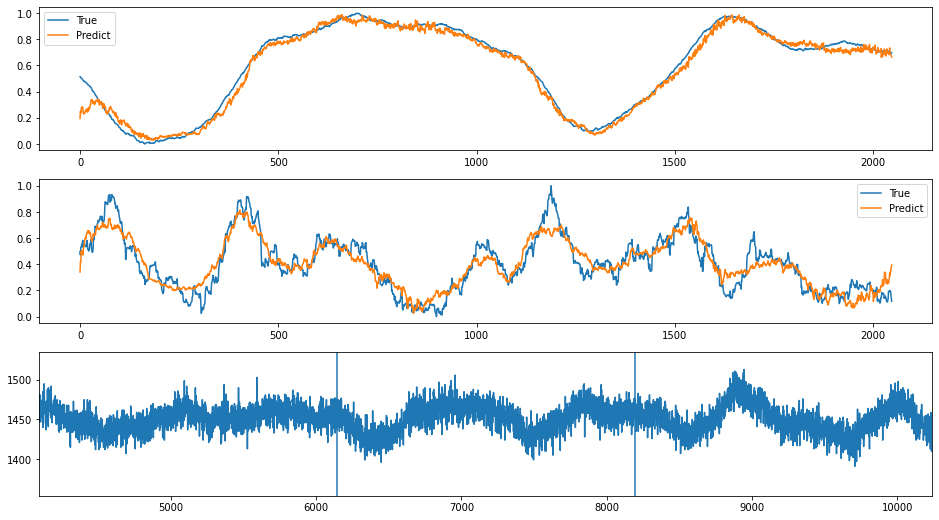

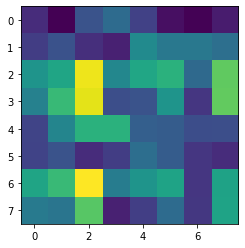

index: 98222
Error: 0.005145752061389008
type                                                         Inst
fill                                                         6384
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-12 22:00:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6384/...
n_bunches                                                    1292
bunch_index                                                  3367
bunch_number                                                 1265
ts_length                                                   65536
chunk                                                           6
Name: 1584, dtype: object


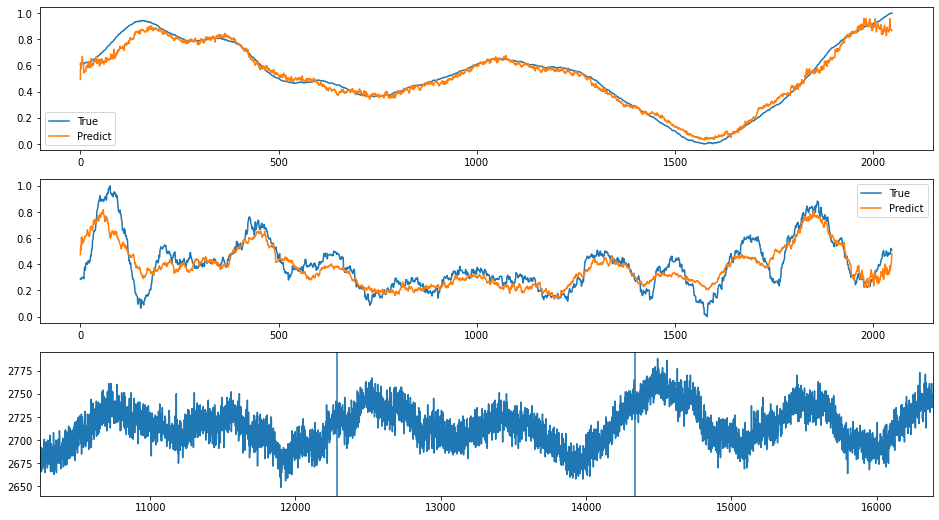

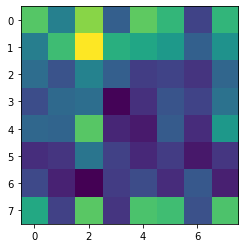

index: 139626
Error: 0.005145768317773021
type                                                         Inst
fill                                                         6356
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-02 06:28:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6356/...
n_bunches                                                    1868
bunch_index                                                    45
bunch_number                                                   12
ts_length                                                   65536
chunk                                                          27
Name: 7034, dtype: object


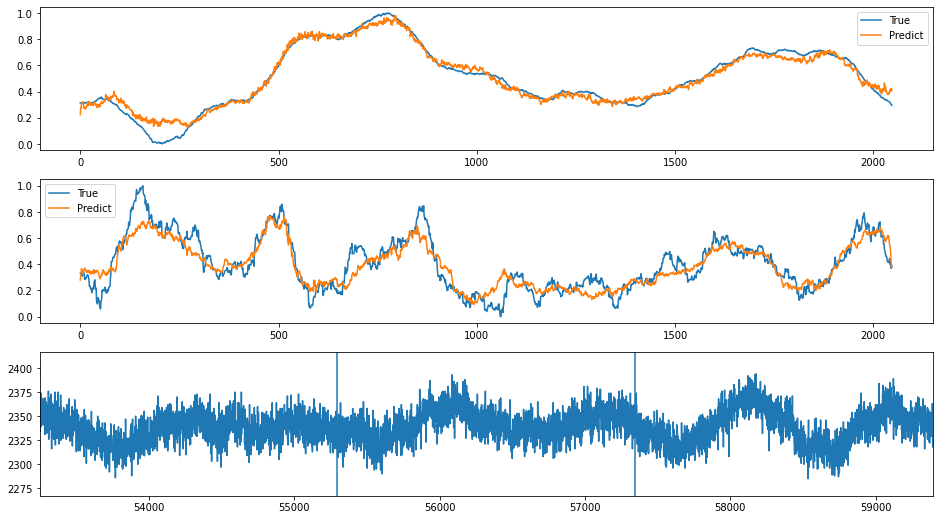

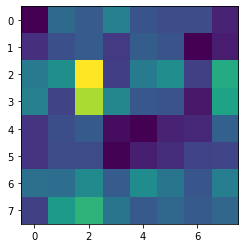

index: 229035
Error: 0.005145773056718773
type                                                         Inst
fill                                                         6245
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-26 19:12:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6245/...
n_bunches                                                    1916
bunch_index                                                  1218
bunch_number                                                  672
ts_length                                                   65536
chunk                                                          21
Name: 5406, dtype: object


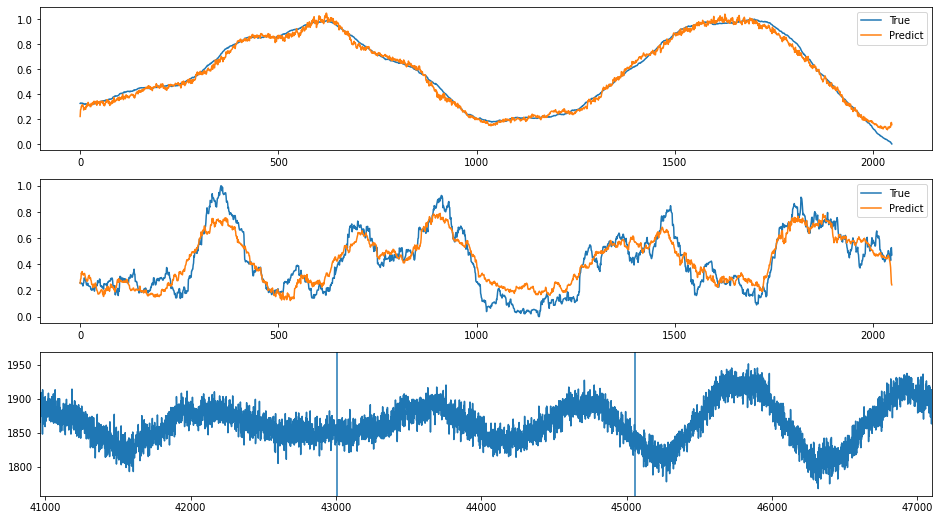

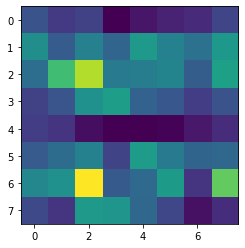

index: 16981
Error: 0.005145716417252269
type                                                         Inst
fill                                                         6891
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-06 18:47:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6891/...
n_bunches                                                    1452
bunch_index                                                  1432
bunch_number                                                  594
ts_length                                                   65536
chunk                                                          21
Name: 5617, dtype: object


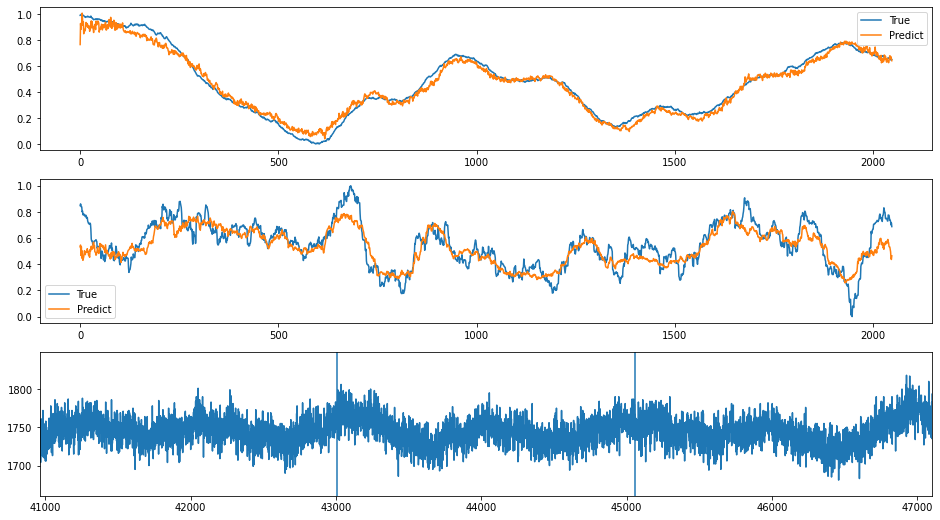

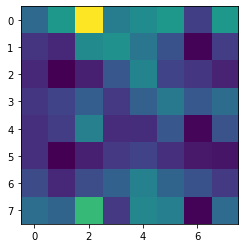

index: 336574
Error: 0.005145712785778314
type                                                         Inst
fill                                                         6346
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-30 05:27:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6346/...
n_bunches                                                    1868
bunch_index                                                  2872
bunch_number                                                 1539
ts_length                                                   65536
chunk                                                          14
Name: 3825, dtype: object


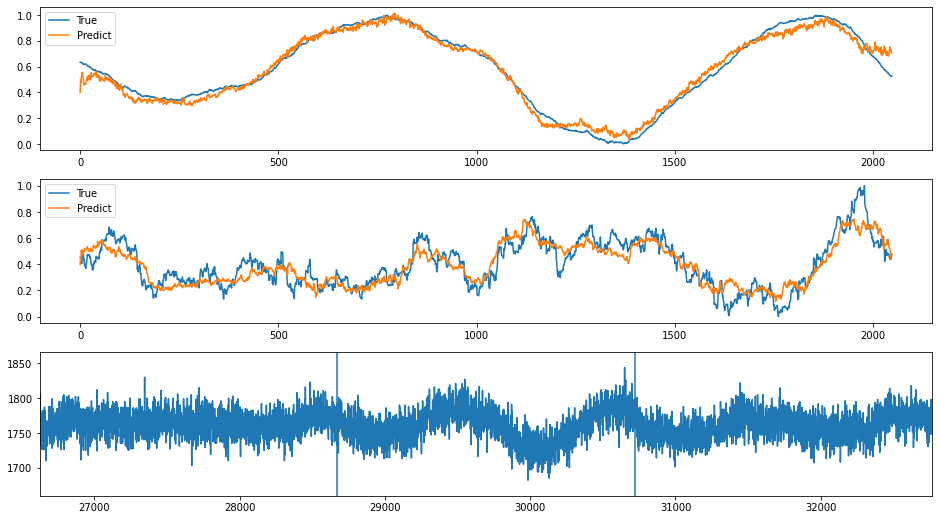

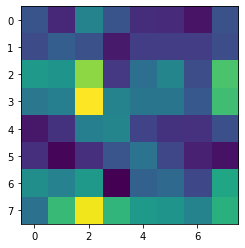

index: 334861
Error: 0.005145778309064925
type                                                         Inst
fill                                                         6337
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-27 06:56:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6337/...
n_bunches                                                    1868
bunch_index                                                  1306
bunch_number                                                  701
ts_length                                                   65536
chunk                                                          14
Name: 3626, dtype: object


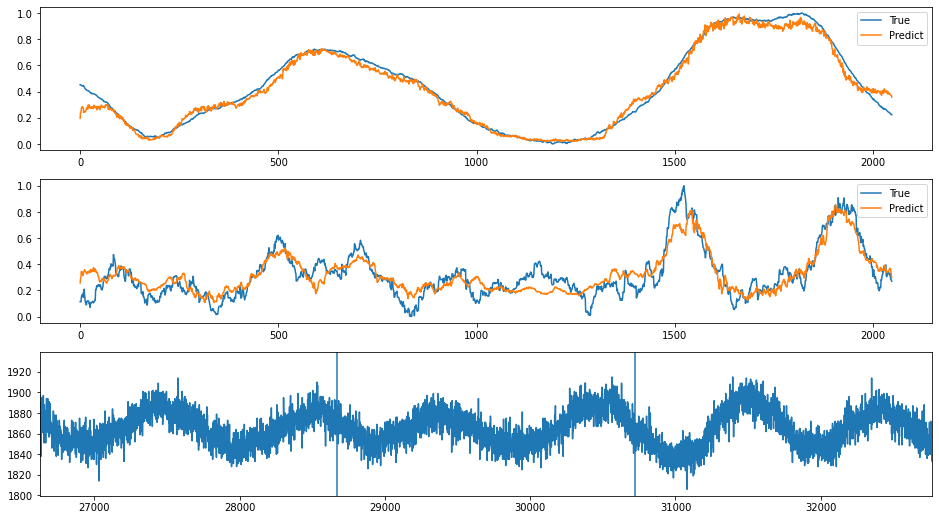

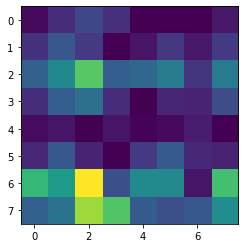

index: 135419
Error: 0.00514570342274197
type                                                         Inst
fill                                                         6356
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-02 03:01:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6356/...
n_bunches                                                    1868
bunch_index                                                   137
bunch_number                                                   57
ts_length                                                   65536
chunk                                                          11
Name: 2908, dtype: object


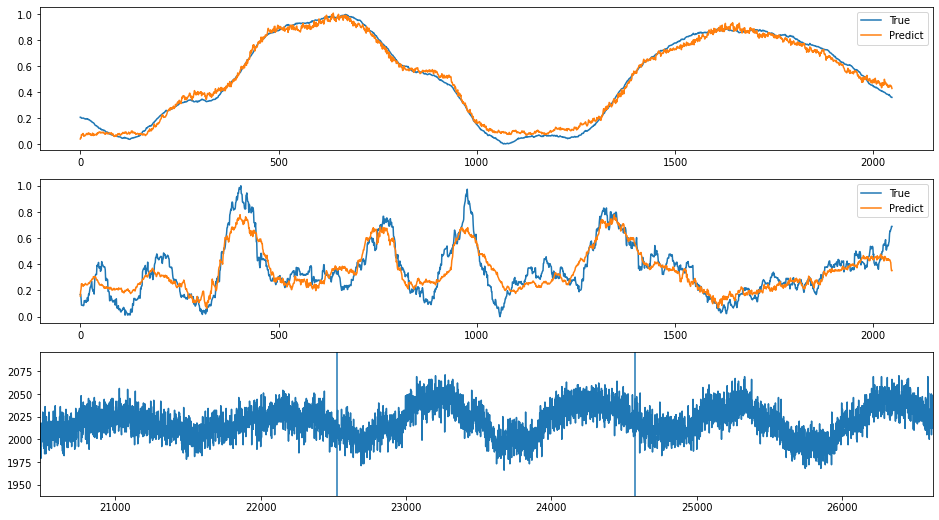

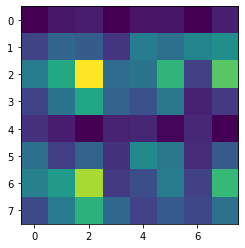

index: 393383
Error: 0.005145702891771785
type                                                         Inst
fill                                                         6201
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-15 02:11:57
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6201/...
n_bunches                                                     205
bunch_index                                                   232
bunch_number                                                  150
ts_length                                                   65536
chunk                                                           1
Name: 506, dtype: object


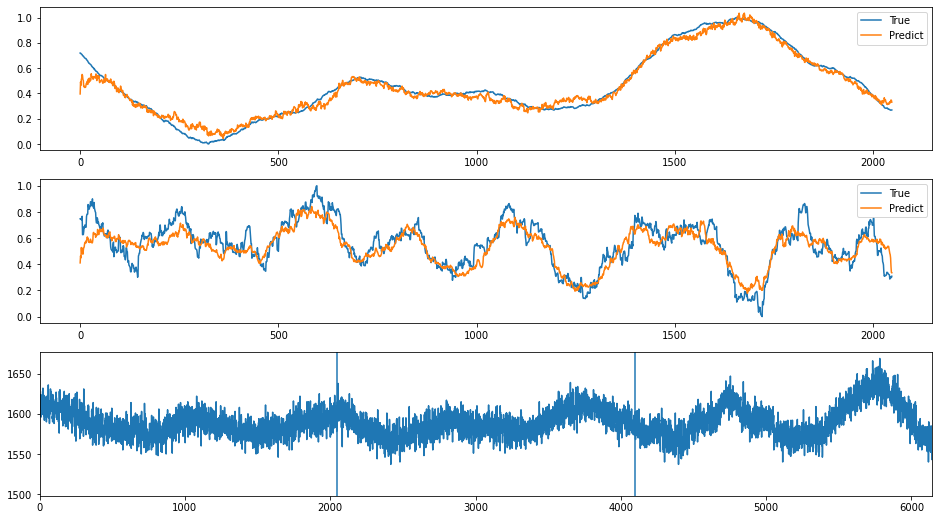

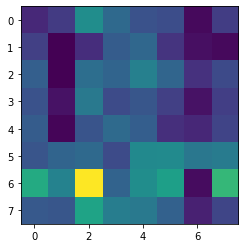

index: 9041
Error: 0.005145787985668791
type                                                         Inst
fill                                                         7487
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-30 21:02:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7487/...
n_bunches                                                     733
bunch_index                                                  3024
bunch_number                                                  640
ts_length                                                   65536
chunk                                                           8
Name: 2130, dtype: object


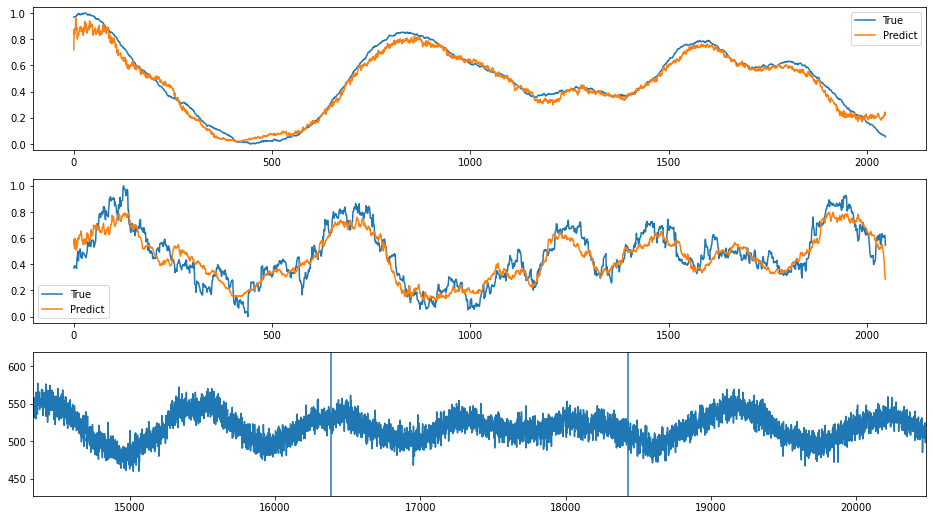

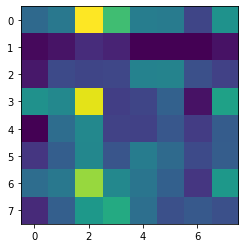

In [28]:
for i in range(10):
    index = sorted_error_indices_around_peak[i]
    plot_train_index(index)

# Around a point

In [29]:
# point = 

In [30]:
# error_around_peak = abs(train_error - point)
# sorted_error_indices_around_point = np.argsort(error_around_peak)

In [31]:
# for i in range(10):
#     index = sorted_error_indices_around_point[i]
#     plot_train_index(index)

# Clustering

In [32]:
indices = sorted_error_indices[-np.arange(1, 1024+1)]
encoding_true = train_data[indices]
encoding_pred = train_prediction[indices]
encoding_meta = train_meta.iloc[indices]
encoded = checker.encode(encoding_true)
encoded_2d = encoded.reshape(encoded.shape[0], -1)

In [33]:
encoded_2d.shape

(1024, 64)

In [34]:
def plot_clusters(cluster_indices):
    print(f"N samples: {len(cluster_indices)}")
    fig, axes = plt.subplots(2,1, figsize=(12, 3))
    axes[0].plot(encoding_true[cluster_indices][:,:, 0].T, linewidth=0, marker=',', alpha=0.1)
    axes[1].plot(encoding_true[cluster_indices][:,:, 1].T, linewidth=0, marker=',', alpha=0.1)
    return fig, axes

In [35]:
import sklearn
from sklearn.manifold import TSNE

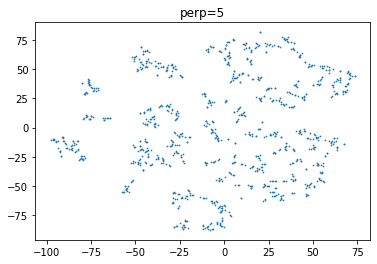

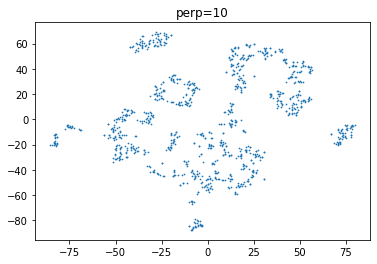

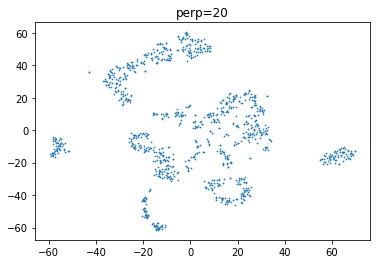

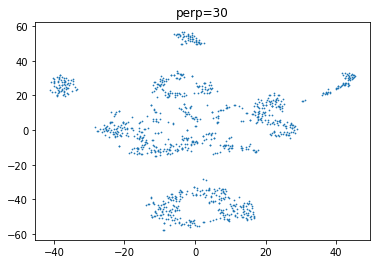

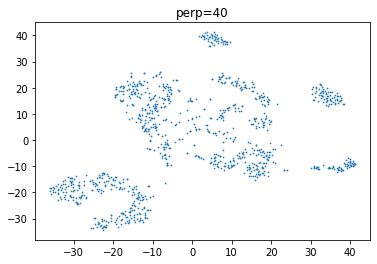

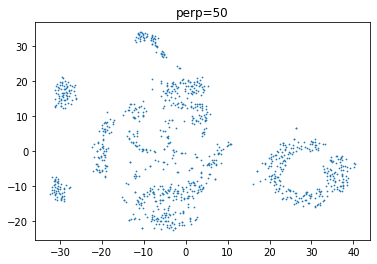

In [36]:
for perplexity in [5, 10, 20, 30, 40, 50]: 
    tsne = TSNE(perplexity=perplexity)
    encoded_2d_tsne = tsne.fit_transform(encoded_2d)
    plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2)
    plt.title(f"perp={perplexity}")
    plt.show()

In [37]:
tsne = TSNE(perplexity=30)
encoded_2d_tsne = tsne.fit_transform(encoded_2d)

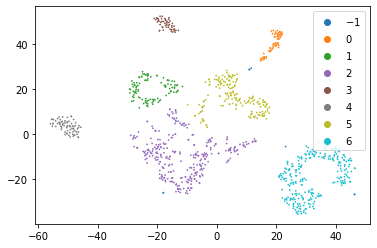

cluster -1
N samples: 8


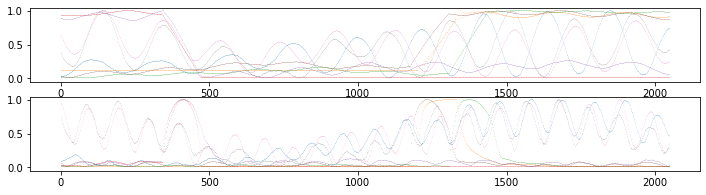

cluster 0
N samples: 57


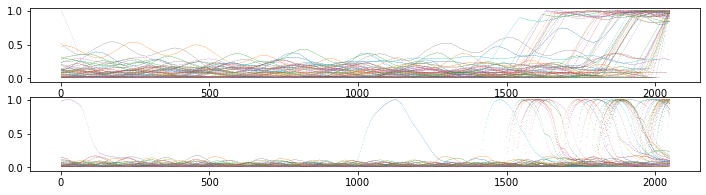

cluster 1
N samples: 100


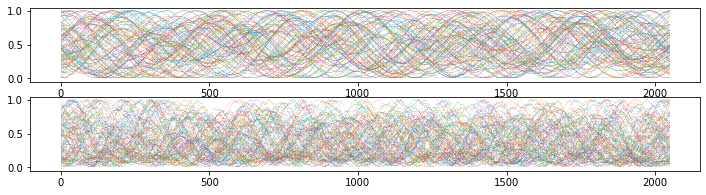

cluster 2
N samples: 309


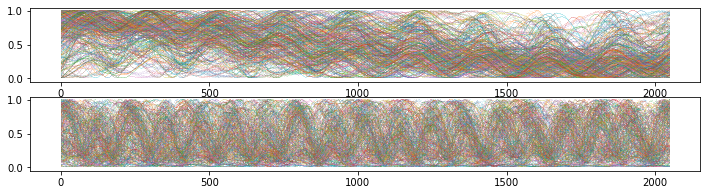

cluster 3
N samples: 50


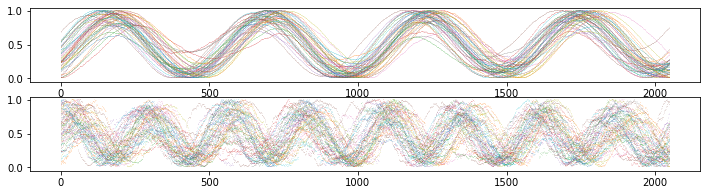

cluster 4
N samples: 71


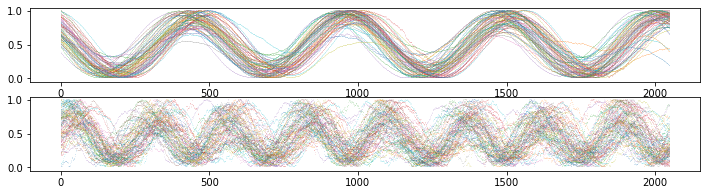

cluster 5
N samples: 172


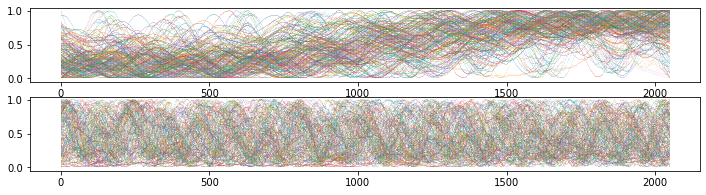

cluster 6
N samples: 257


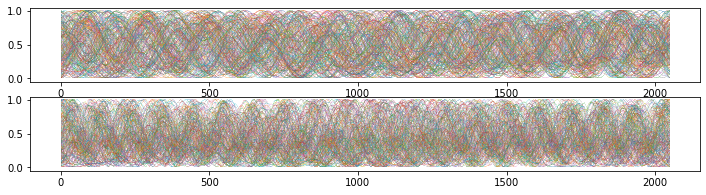

In [38]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=4)
clustering = dbscan.fit(encoded_2d_tsne)
sc = plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2, c=clustering.labels_, cmap='tab10')
plt.legend(*sc.legend_elements())
plt.show()
for cluster in np.unique(clustering.labels_):
    cluster_indices = np.where(clustering.labels_ == cluster)[0]
    print("cluster", cluster)
    fig, axes = plot_clusters(cluster_indices)
    plt.show()